In [2]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import datetime
import seaborn as sns
from scipy import stats
# from scipy.interpolate import splrep, splev
year = datetime.datetime.today().year

In [3]:
traffic_data = pd.read_csv('dft_traffic_counts_raw_counts.csv')

In [4]:
traffic_data.region_name.unique()

array(['Wales', 'Scotland', 'London', 'East of England', 'East Midlands',
       'Yorkshire and The Humber', 'South East', 'South West',
       'West Midlands', 'North West', 'North East'], dtype=object)

## Task 1

In [5]:
traffic_mileage = traffic_data.drop(['count_point_id', 'direction_of_travel', 'year', 'count_date', 'hour',
       'region_id', 'region_ons_code', 'local_authority_id',
       'local_authority_name', 'local_authoirty_ons_code', 'road_name',
       'road_category', 'road_type', 'start_junction_road_name',
       'end_junction_road_name', 'easting', 'northing', 'latitude',
       'longitude', 'link_length_miles', 'pedal_cycles',
       'two_wheeled_motor_vehicles', 'cars_and_taxis', 'buses_and_coaches',
       'lgvs', 'hgvs_2_rigid_axle', 'hgvs_3_rigid_axle',
       'hgvs_4_or_more_rigid_axle', 'hgvs_3_or_4_articulated_axle',
       'hgvs_5_articulated_axle', 'hgvs_6_articulated_axle', 'all_hgvs',
       'all_motor_vehicles'], axis=1)

In [6]:
average_mileage = traffic_mileage.groupby(['region_name']).mean()

In [7]:
traffic_data = traffic_data.drop(['road_category', 'direction_of_travel', 'region_ons_code', 'local_authority_id',
       'local_authority_name', 'local_authoirty_ons_code', 'road_type', 'start_junction_road_name',
       'end_junction_road_name', 'easting', 'northing', 'latitude',
       'longitude', 'link_length_km', 'link_length_miles'], axis=1)

In [8]:
traffic_data = traffic_data.sort_values('year', axis=0, ascending=True)
traffic_data.head()

,count_point_id,year,count_date,hour,region_id,region_name,road_name,pedal_cycles,two_wheeled_motor_vehicles,cars_and_taxis,buses_and_coaches,lgvs,hgvs_2_rigid_axle,hgvs_3_rigid_axle,hgvs_4_or_more_rigid_axle,hgvs_3_or_4_articulated_axle,hgvs_5_articulated_axle,hgvs_6_articulated_axle,all_hgvs,all_motor_vehicles
0,501,2000,2000-06-09,7,4,Wales,M4,0,6,2491,33,539,164,25,22,25,91,59,391,3460
121107,99128,2000,2000-10-12,10,2,East Midlands,A5199,0,1,59,1,19,6,1,3,1,1,2,17,97
121108,99128,2000,2000-10-12,11,2,East Midlands,A5199,0,0,39,1,23,4,1,3,1,2,2,12,75
121109,99128,2000,2000-10-12,12,2,East Midlands,A5199,1,0,65,1,11,10,1,1,1,3,0,17,94
121110,99128,2000,2000-10-12,13,2,East Midlands,A5199,0,1,49,1,9,2,0,8,0,1,0,11,71


In [9]:
traffic_year = traffic_data.drop(['count_point_id', 'region_name', 'count_date', 'hour',
       'region_id', 'road_name'], axis=1)

traffic_year = traffic_year.groupby(['year'], axis=0)['pedal_cycles',
       'two_wheeled_motor_vehicles', 'cars_and_taxis', 'buses_and_coaches',
       'lgvs', 'hgvs_2_rigid_axle', 'hgvs_3_rigid_axle',
       'hgvs_4_or_more_rigid_axle', 'hgvs_3_or_4_articulated_axle',
       'hgvs_5_articulated_axle', 'hgvs_6_articulated_axle', 'all_hgvs',
       'all_motor_vehicles'].sum()

traffic_year.head()

,pedal_cycles,two_wheeled_motor_vehicles,cars_and_taxis,buses_and_coaches,lgvs,hgvs_2_rigid_axle,hgvs_3_rigid_axle,hgvs_4_or_more_rigid_axle,hgvs_3_or_4_articulated_axle,hgvs_5_articulated_axle,hgvs_6_articulated_axle,all_hgvs,all_motor_vehicles
year,,,,,,,,,,,,,
2000,449098,1158822,100677849,1428400,15874559,4559248,607021,629792,607021,2475804,1480976,10740185,129879815
2001,537224,1377795,107985870,1584419,17121975,4573383,643813,648667,643813,2418771,1629978,10830938,138900997
2002,509905,1313449,104179345,1520213,16200579,4429573,619816,613456,619816,2221877,1568964,10265022,133478471
2003,614112,1429841,103287887,1565517,16096236,4162902,592740,589899,592740,2029395,1506797,9586254,131965179
2004,556938,1233381,97285597,1496508,15572605,3850144,558653,556319,558653,1984424,1504481,9102497,124689879


In [10]:
traffic_year_region = traffic_data.drop(['count_point_id', 'count_date', 'hour',
       'region_id', 'road_name'], axis=1)

traffic_year_region = traffic_year_region.groupby(['year', 'region_name'], axis=0)['pedal_cycles',
       'two_wheeled_motor_vehicles', 'cars_and_taxis', 'buses_and_coaches',
       'lgvs', 'hgvs_2_rigid_axle', 'hgvs_3_rigid_axle',
       'hgvs_4_or_more_rigid_axle', 'hgvs_3_or_4_articulated_axle',
       'hgvs_5_articulated_axle', 'hgvs_6_articulated_axle', 'all_hgvs',
       'all_motor_vehicles'].sum()


traffic_year_region.head()

pedal_cycles  two_wheeled_motor_vehicles  \
year region_name                                                 
2000 East Midlands           28803                       56942   
     East of England         50756                      107809   
     London                 124832                      420512   
     North East              11068                       28048   
     North West              49916                       99678   

                      cars_and_taxis  buses_and_coaches     lgvs  \
year region_name                                                   
2000 East Midlands           7133928              78788  1141592   
     East of England        10346357             107209  1718423   
     London                 11084461             276473  2070411   
     North East              4283208              63276   638707   
     North West             14336478             219153  2173501   

                      hgvs_2_rigid_axle  hgvs_3_rigid_axle  \
year region_name                                             
2000 East Midlands               403943              50439   
     East of England             494438              59749   
     London                      463980              43985   
     North East                  187168              27261   
     North West                  641945              88966   

                      hgvs_4_or_more_rigid_axle  hgvs_3_or_4_articulated_axle  \
year region_name                                                                
2000 East Midlands                        53316                         50439   
     East of England                      68178                         59749   
     London                               61025                         43985   
     North East                           30757                         27261   
     North West                           98798                         88966   

                      hgvs_5_articulated_axle  hgvs_6_articulated_axle  \
year region_name                                                         
2000 East Midlands                     257261                   173764   
     East of England                   326621                   216854   
     London                             87932                    51095   
     North East                         77363                    53427   
     North West                        367585                   213504   

                      all_hgvs  all_motor_vehicles  
year region_name                                    
2000 East Midlands     1044241             9455491  
     East of England   1288291            13568089  
     London             753861            14605718  
     North East         407385             5420624  
     North West        1555799            18384609

In [11]:
traffic_year_region = traffic_data.drop(['count_point_id', 'count_date', 'hour',
       'region_id', 'road_name'], axis=1)

traffic_region_year = traffic_year_region.groupby(['region_name', 'year'], axis=0)['pedal_cycles',
       'two_wheeled_motor_vehicles', 'cars_and_taxis', 'buses_and_coaches',
       'lgvs', 'hgvs_2_rigid_axle', 'hgvs_3_rigid_axle',
       'hgvs_4_or_more_rigid_axle', 'hgvs_3_or_4_articulated_axle',
       'hgvs_5_articulated_axle', 'hgvs_6_articulated_axle', 'all_hgvs',
       'all_motor_vehicles'].sum()



traffic_region_year = traffic_region_year.drop(['all_hgvs', 'all_motor_vehicles'], axis=1)
traffic_region_year.head()

pedal_cycles  two_wheeled_motor_vehicles  cars_and_taxis  \
region_name   year                                                             
East Midlands 2000         28803                       56942         7133928   
              2001         32621                       71757         7816430   
              2002         29519                       69753         7497161   
              2003         34386                       71483         7633316   
              2004         29479                       57227         7052370   

                    buses_and_coaches     lgvs  hgvs_2_rigid_axle  \
region_name   year                                                  
East Midlands 2000              78788  1141592             403943   
              2001              90068  1260352             417300   
              2002              79359  1244403             361298   
              2003              85725  1243196             333836   
              2004              80816  1192483             319344   

                    hgvs_3_rigid_axle  hgvs_4_or_more_rigid_axle  \
region_name   year                                                 
East Midlands 2000              50439                      53316   
              2001              54875                      53494   
              2002              52580                      55225   
              2003              51415                      49046   
              2004              47391                      47161   

                    hgvs_3_or_4_articulated_axle  hgvs_5_articulated_axle  \
region_name   year                                                          
East Midlands 2000                         50439                   257261   
              2001                         54875                   253445   
              2002                         52580                   261707   
              2003                         51415                   235498   
              2004                         47391                   235960   

                    hgvs_6_articulated_axle  
region_name   year                           
East Midlands 2000                   173764  
              2001                   203906  
              2002                   185674  
              2003                   175061  
              2004                   185536

In [12]:
average_mileage_region = traffic_region_year.groupby(['region_name'], axis=0)['pedal_cycles',
       'two_wheeled_motor_vehicles', 'cars_and_taxis', 'buses_and_coaches',
       'lgvs', 'hgvs_2_rigid_axle', 'hgvs_3_rigid_axle',
       'hgvs_4_or_more_rigid_axle', 'hgvs_3_or_4_articulated_axle',
       'hgvs_5_articulated_axle', 'hgvs_6_articulated_axle'].mean()
average_mileage_region

,pedal_cycles,two_wheeled_motor_vehicles,cars_and_taxis,buses_and_coaches,lgvs,hgvs_2_rigid_axle,hgvs_3_rigid_axle,hgvs_4_or_more_rigid_axle,hgvs_3_or_4_articulated_axle,hgvs_5_articulated_axle,hgvs_6_articulated_axle
region_name,,,,,,,,,,,
East Midlands,30697.947368,53346.947368,6.609689e+06,69759.052632,1.124382e+06,260551.947368,42609.736842,44963.789474,42609.736842,196787.000000,186391.052632
East of England,50095.368421,93209.157895,9.370938e+06,87960.052632,1.680054e+06,365884.526316,52756.157895,63390.000000,52756.157895,230052.842105,235495.842105
London,237468.000000,393297.315789,9.712226e+06,290483.842105,2.014256e+06,405614.473684,51567.894737,83679.526316,51567.894737,55294.157895,69959.578947
North East,13678.789474,26774.631579,4.137328e+06,57105.842105,6.761646e+05,116731.105263,22039.736842,25221.631579,22039.736842,47853.157895,57751.684211
North West,51487.631579,82846.473684,1.260966e+07,156410.105263,2.002237e+06,452574.947368,70337.736842,76818.578947,70337.736842,223528.631579,261792.210526
Scotland,12100.578947,22390.473684,3.955769e+06,73232.578947,6.187716e+05,157318.315789,26702.947368,25906.210526,26702.947368,58765.842105,59946.526316
South East,80001.315789,182314.578947,1.690104e+07,152600.000000,2.783922e+06,531229.789474,80096.578947,95099.421053,80096.578947,296311.315789,213946.315789
South West,43725.263158,87635.947368,7.158425e+06,85230.631579,1.170098e+06,214845.421053,45078.631579,33498.105263,45078.631579,93592.210526,89660.210526
Wales,11014.526316,30288.631579,4.361704e+06,59824.052632,6.995403e+05,128305.105263,26344.526316,24912.684211,26344.526316,64881.947368,53409.000000


In [13]:
traffic_region = traffic_region_year.reset_index()
traffic_region = traffic_region.set_index('region_name')
traffic_region.head()

,year,pedal_cycles,two_wheeled_motor_vehicles,cars_and_taxis,buses_and_coaches,lgvs,hgvs_2_rigid_axle,hgvs_3_rigid_axle,hgvs_4_or_more_rigid_axle,hgvs_3_or_4_articulated_axle,hgvs_5_articulated_axle,hgvs_6_articulated_axle
region_name,,,,,,,,,,,,
East Midlands,2000,28803,56942,7133928,78788,1141592,403943,50439,53316,50439,257261,173764
East Midlands,2001,32621,71757,7816430,90068,1260352,417300,54875,53494,54875,253445,203906
East Midlands,2002,29519,69753,7497161,79359,1244403,361298,52580,55225,52580,261707,185674
East Midlands,2003,34386,71483,7633316,85725,1243196,333836,51415,49046,51415,235498,175061
East Midlands,2004,29479,57227,7052370,80816,1192483,319344,47391,47161,47391,235960,185536


In [14]:
years = list(range(year, year -21, -1))
# years.remove([2020, 2019, 2018])
years = years[2:]
print(sorted(years))


[2000, 2001, 2002, 2003, 2004, 2005, 2006, 2007, 2008, 2009, 2010, 2011, 2012, 2013, 2014, 2015, 2016, 2017, 2018]


In [15]:
mileage_dict = {}
for m in sorted(years):
     mileage_dict[m] = traffic_region[traffic_region['year']==m].iloc[:,1:].mul(list(average_mileage['link_length_km']), axis=0)
d = { k: v for k, v in mileage_dict.items()}
average_mileage_region = pd.concat(d, axis=1)

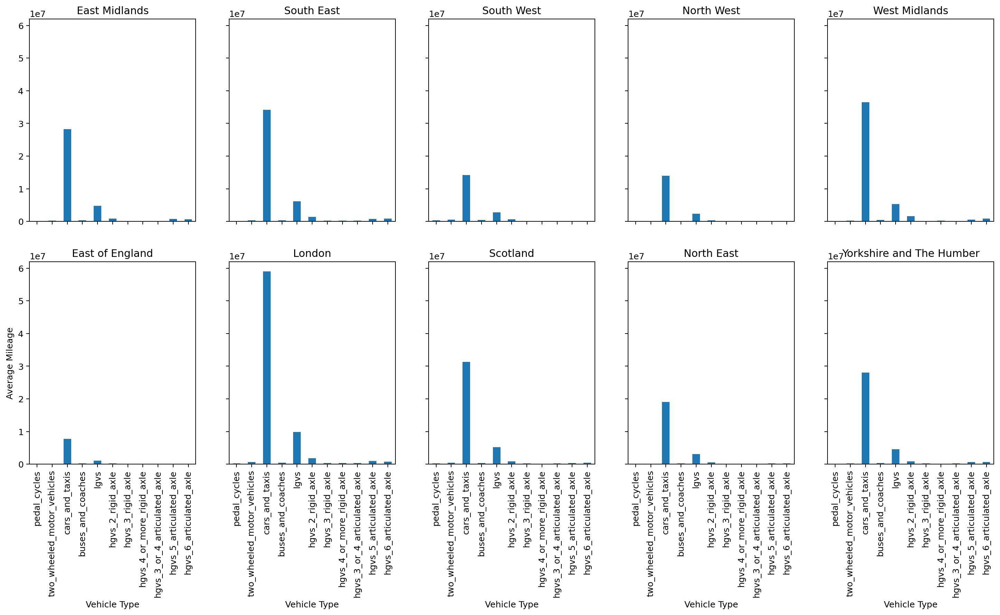

In [16]:
fig = plt.figure(figsize=(20,25), dpi=180)
ax1 = fig.add_subplot(5,5,1)
average_mileage_region[2010].iloc[0,:].plot.bar()
plt.title('East Midlands')
count = 1
for exp in range(1, len(average_mileage_region)-1):
    count += 1
    fig.add_subplot(5,5,count, sharex=ax1, sharey=ax1)
    plt.xlabel('Vehicle Type')
    plt.ylabel('Average Mileage')
    plt.title(traffic_data.region_name.unique()[count])
    average_mileage_region[2010].iloc[exp,:].plot.bar()
#     plt.axis('off')
#     plt.title('Mileage per region - 2000')
plt.savefig('Traffic 2000s')
plt.show()

In [17]:
cumulative_traffic_changes = traffic_region_year.groupby(['region_name'], axis=0).pct_change().cumsum()
# cumulative_traffic_changes = cumulative_traffic_changes.fillna(0)
rolling_traffic_changes = traffic_region_year.groupby(['region_name'], axis=0).pct_change()
# rolling_traffic_changes =rolling_traffic_changes.fillna(0)

In [18]:
cumulative_traffic_changes.head()

pedal_cycles  two_wheeled_motor_vehicles  cars_and_taxis  \
region_name   year                                                             
East Midlands 2000           NaN                         NaN             NaN   
              2001      0.132556                    0.260177        0.095670   
              2002      0.037464                    0.232249        0.054824   
              2003      0.202340                    0.257051        0.072985   
              2004      0.059637                    0.057619       -0.003122   

                    buses_and_coaches      lgvs  hgvs_2_rigid_axle  \
region_name   year                                                   
East Midlands 2000                NaN       NaN                NaN   
              2001           0.143169  0.104030           0.033067   
              2002           0.024270  0.091376          -0.101134   
              2003           0.104488  0.090406          -0.177144   
              2004           0.047223  0.049613          -0.220554   

                    hgvs_3_rigid_axle  hgvs_4_or_more_rigid_axle  \
region_name   year                                                 
East Midlands 2000                NaN                        NaN   
              2001           0.087948                   0.003339   
              2002           0.046125                   0.035697   
              2003           0.023969                  -0.076190   
              2004          -0.054296                  -0.114624   

                    hgvs_3_or_4_articulated_axle  hgvs_5_articulated_axle  \
region_name   year                                                          
East Midlands 2000                           NaN                      NaN   
              2001                      0.087948                -0.014833   
              2002                      0.046125                 0.017766   
              2003                      0.023969                -0.082381   
              2004                     -0.054296                -0.080419   

                    hgvs_6_articulated_axle  
region_name   year                           
East Midlands 2000                      NaN  
              2001                 0.173465  
              2002                 0.084051  
              2003                 0.026892  
              2004                 0.086728

## Task 2


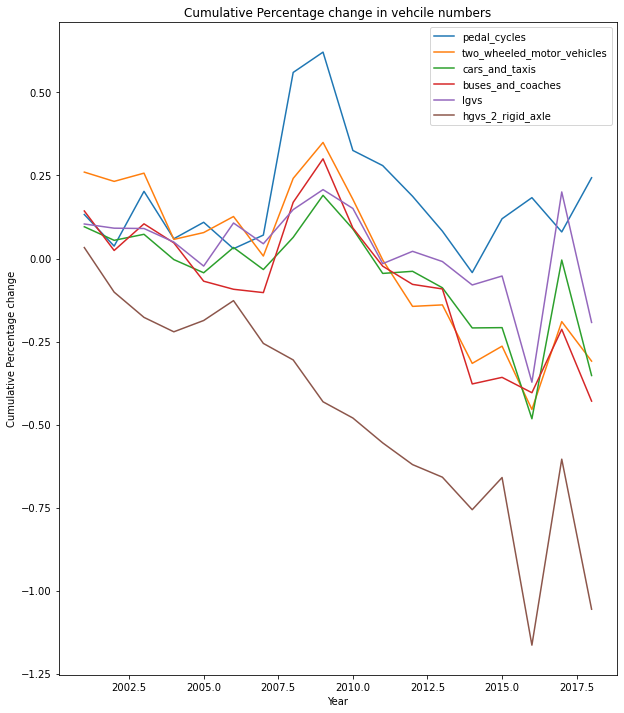

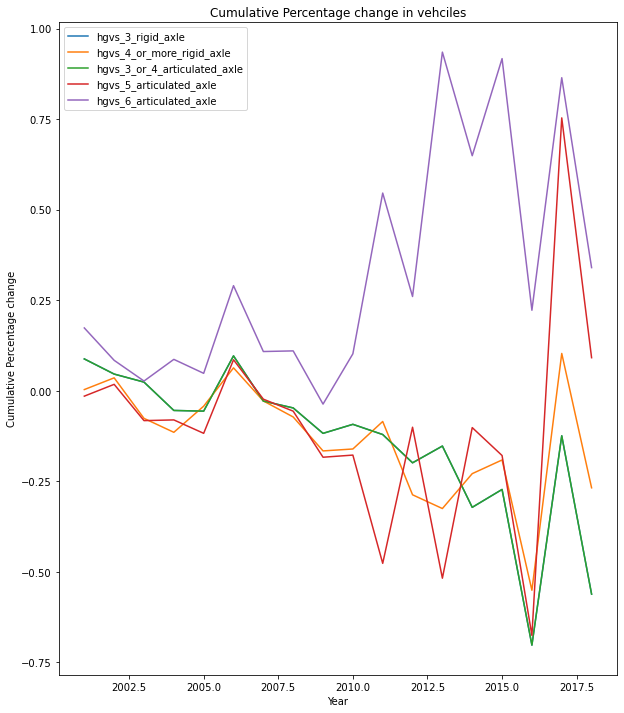

In [19]:
cumulative_traffic_changes.loc['East Midlands'].iloc[:,:6].plot(figsize=(10,12))
plt.title('Cumulative Percentage change in vehcile numbers')
plt.ylabel('Cumulative Percentage change')
plt.xlabel('Year')
plt.savefig('Cumulative Percentage Change')
plt.show()
cumulative_traffic_changes.loc['East Midlands'].iloc[:,6:].plot(figsize=(10,12))
plt.title('Cumulative Percentage change in vehciles')
plt.ylabel('Cumulative Percentage change')
plt.xlabel('Year')
plt.savefig('Cumulative PCT Change')
plt.show()

In [20]:
# plt.figure(num=None, figsize=(8, 6), dpi=180, facecolor='w', edgecolor='k')
# regions_list = list(traffic_data.region_name.unique())
# plt.scatter(x=sorted(years), y=cumulative_traffic_changes.loc[regions_list[1]].iloc[:,1])
# plt.xticks(sorted(years), rotation=90)
# plt.title('Two wheeled motors: East Midlands')
# plt.show()

In [21]:
regions_list = traffic_data.region_name.unique()
regions_list

array(['Wales', 'East Midlands', 'South East', 'South West', 'North West',
       'West Midlands', 'East of England', 'London', 'Scotland',
       'North East', 'Yorkshire and The Humber'], dtype=object)

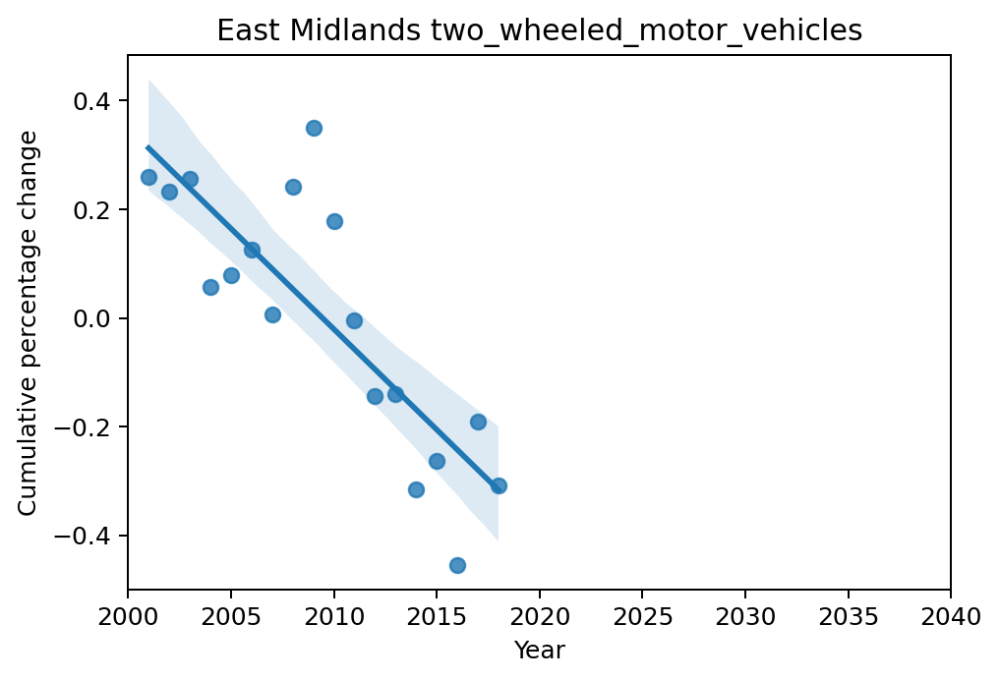

In [22]:
plt.figure(num=None, figsize=(6, 4), dpi=180, facecolor='w', edgecolor='k')
plt.xlim(2000, 2040)
ax = sns.regplot(x=sorted(years), y=cumulative_traffic_changes.loc['East Midlands'].iloc[:,1])
ax.set(xlabel='Year', ylabel='Cumulative percentage change')
plt.title('East Midlands' + ' ' + cumulative_traffic_changes.columns[1])
plt.savefig('Regression Analysis eg')
plt.show()

************************************************** Wales **************************************************


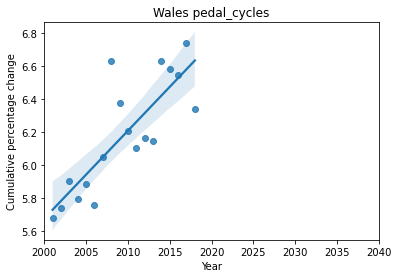

10 year prediction is 7.2692304104455445 % change from the year 2000
20 year prediction is 7.800088737797722 % change from the year 2000


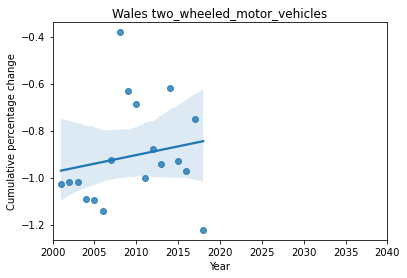

10 year prediction is -0.7565622170694812 % change from the year 2000
20 year prediction is -0.6828513347616969 % change from the year 2000


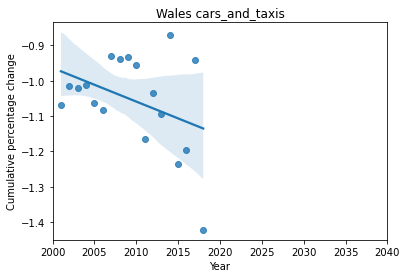

10 year prediction is -1.2495591804912856 % change from the year 2000
20 year prediction is -1.3448587017470537 % change from the year 2000


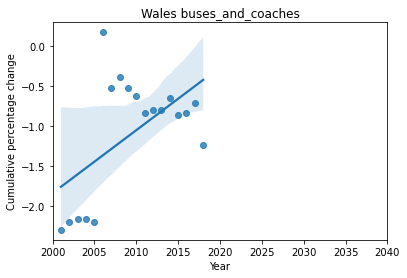

10 year prediction is 0.516409897260246 % change from the year 2000
20 year prediction is 1.3005022717189547 % change from the year 2000


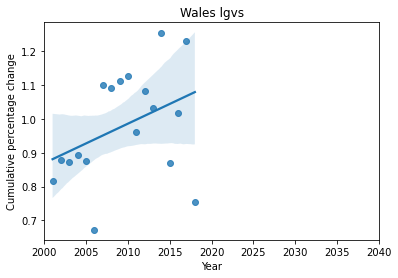

10 year prediction is 1.218764125602739 % change from the year 2000
20 year prediction is 1.3352592974461324 % change from the year 2000


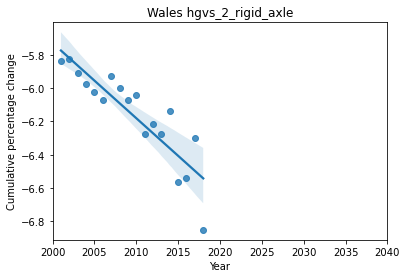

10 year prediction is -7.084592950480413 % change from the year 2000
20 year prediction is -7.536548155624473 % change from the year 2000


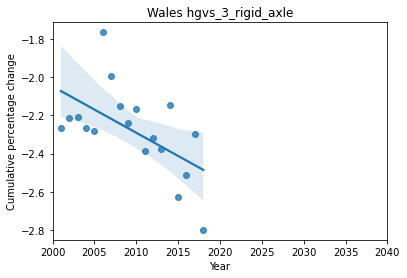

10 year prediction is -2.7760600338907224 % change from the year 2000
20 year prediction is -3.0185980979410516 % change from the year 2000


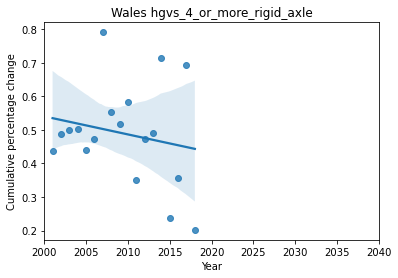

10 year prediction is 0.37874592214287617 % change from the year 2000
20 year prediction is 0.32492574953546516 % change from the year 2000


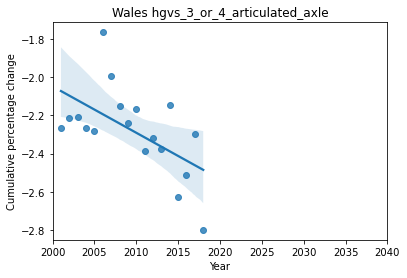

10 year prediction is -2.7760600338907224 % change from the year 2000
20 year prediction is -3.0185980979410516 % change from the year 2000


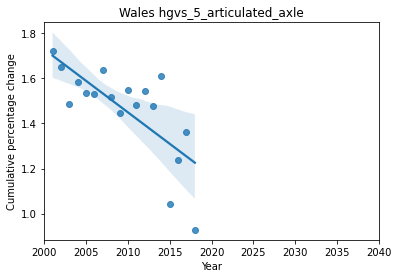

10 year prediction is 0.8904703804146479 % change from the year 2000
20 year prediction is 0.6110733036891887 % change from the year 2000


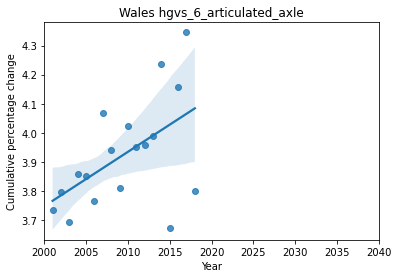

10 year prediction is 4.308492099905216 % change from the year 2000
20 year prediction is 4.4951734238849355 % change from the year 2000
************************************************** East Midlands **************************************************


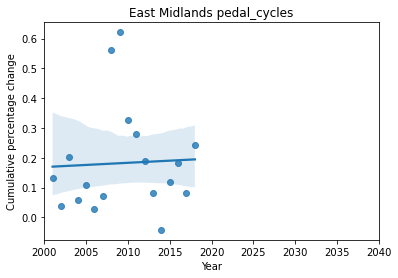

10 year prediction is 0.21173401529066727 % change from the year 2000
20 year prediction is 0.22607538781430048 % change from the year 2000


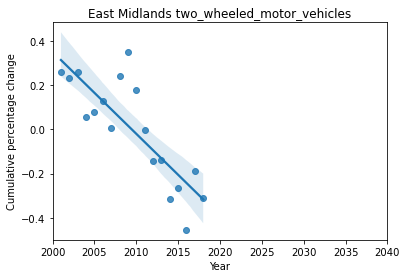

10 year prediction is -0.760385504616238 % change from the year 2000
20 year prediction is -1.1304409974564607 % change from the year 2000


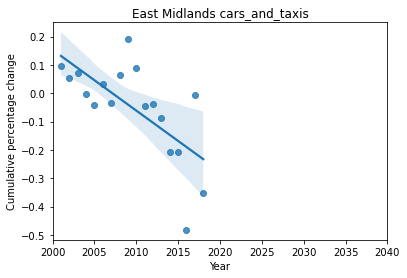

10 year prediction is -0.48976872739442 % change from the year 2000
20 year prediction is -0.7041242817057523 % change from the year 2000


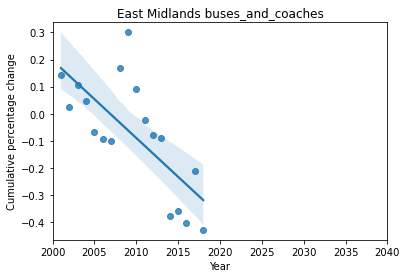

10 year prediction is -0.6632973741009991 % change from the year 2000
20 year prediction is -0.9500991322254393 % change from the year 2000


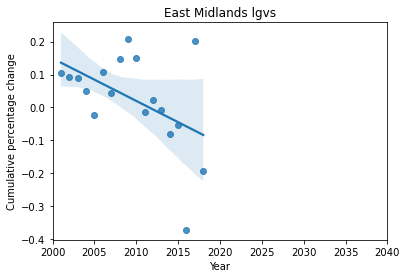

10 year prediction is -0.2388105442761237 % change from the year 2000
20 year prediction is -0.3680602459514475 % change from the year 2000


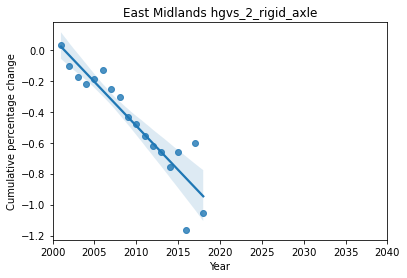

10 year prediction is -1.629587631407702 % change from the year 2000
20 year prediction is -2.1989438751895847 % change from the year 2000


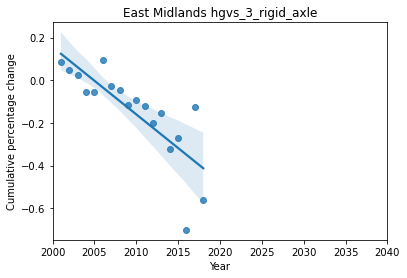

10 year prediction is -0.7918561531241721 % change from the year 2000
20 year prediction is -1.1077733979922613 % change from the year 2000


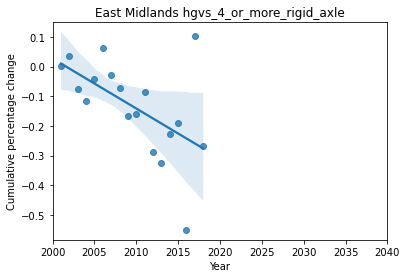

10 year prediction is -0.47826402904816234 % change from the year 2000
20 year prediction is -0.6467870558563433 % change from the year 2000


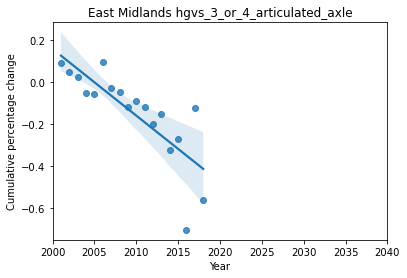

10 year prediction is -0.7918561531241721 % change from the year 2000
20 year prediction is -1.1077733979922613 % change from the year 2000


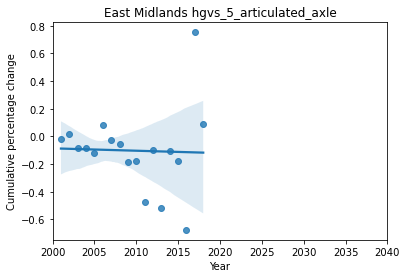

10 year prediction is -0.1374742334477923 % change from the year 2000
20 year prediction is -0.15473588803841665 % change from the year 2000


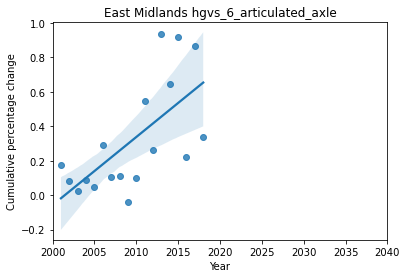

10 year prediction is 1.1290504363351772 % change from the year 2000
20 year prediction is 1.5246167992327884 % change from the year 2000
************************************************** South East **************************************************


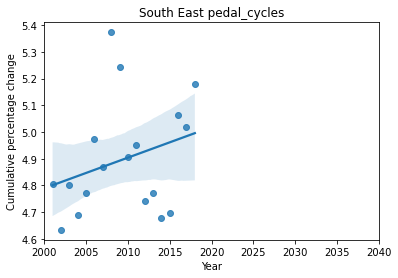

10 year prediction is 5.1335002234992615 % change from the year 2000
20 year prediction is 5.248345351609284 % change from the year 2000


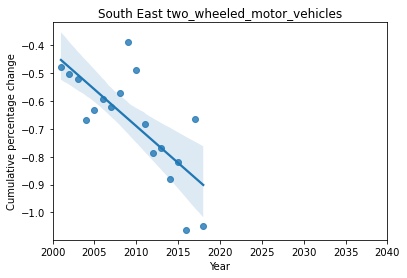

10 year prediction is -1.217584935839021 % change from the year 2000
20 year prediction is -1.4811556227056855 % change from the year 2000


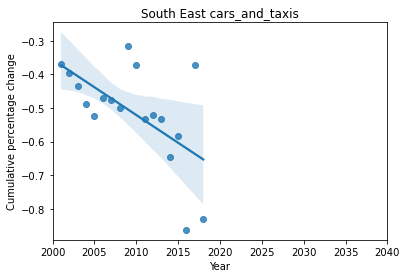

10 year prediction is -0.8509446463895358 % change from the year 2000
20 year prediction is -1.0160117298049798 % change from the year 2000


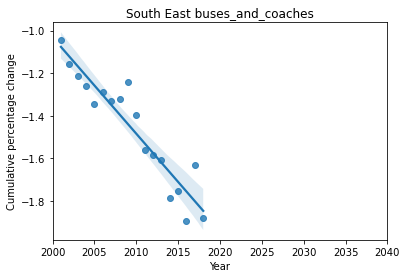

10 year prediction is -2.390268629263872 % change from the year 2000
20 year prediction is -2.8433242588917125 % change from the year 2000


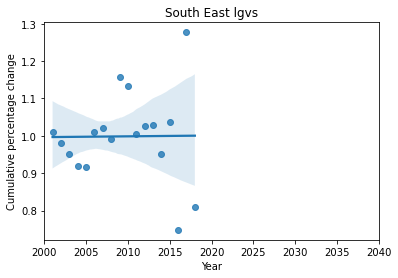

10 year prediction is 1.00299543174462 % change from the year 2000
20 year prediction is 1.0051501743665594 % change from the year 2000


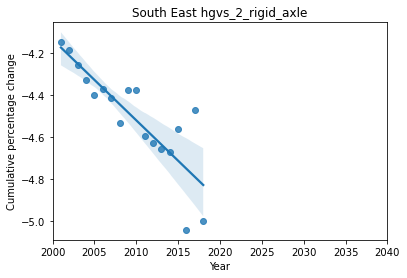

10 year prediction is -5.289207695253879 % change from the year 2000
20 year prediction is -5.674137165530297 % change from the year 2000


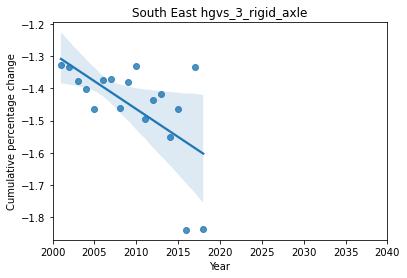

10 year prediction is -1.809586250195423 % change from the year 2000
20 year prediction is -1.9823191931649546 % change from the year 2000


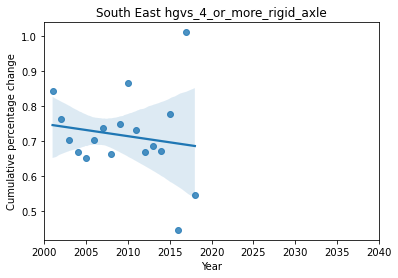

10 year prediction is 0.6436789835096306 % change from the year 2000
20 year prediction is 0.6084733327715828 % change from the year 2000


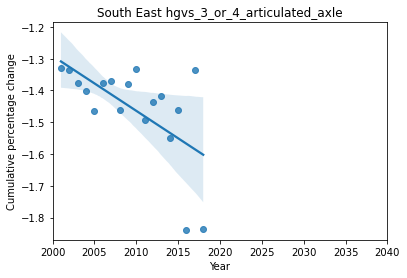

10 year prediction is -1.809586250195423 % change from the year 2000
20 year prediction is -1.9823191931649546 % change from the year 2000


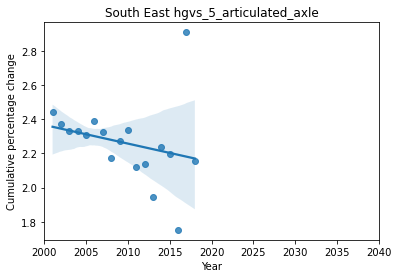

10 year prediction is 2.0387104898893575 % change from the year 2000
20 year prediction is 1.929592337405147 % change from the year 2000


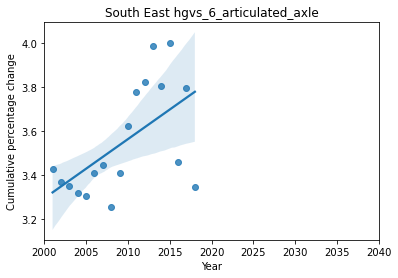

10 year prediction is 4.1027153184743455 % change from the year 2000
20 year prediction is 4.371933358662822 % change from the year 2000
************************************************** South West **************************************************


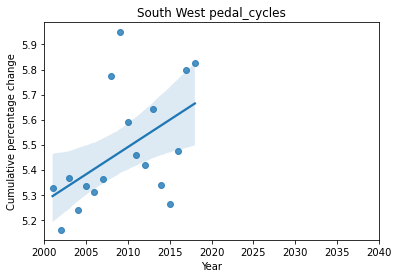

10 year prediction is 5.925608361362102 % change from the year 2000
20 year prediction is 6.143281839815849 % change from the year 2000


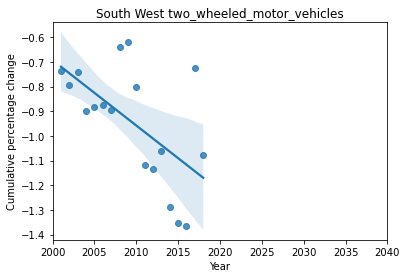

10 year prediction is -1.487426929701435 % change from the year 2000
20 year prediction is -1.7521155669002226 % change from the year 2000


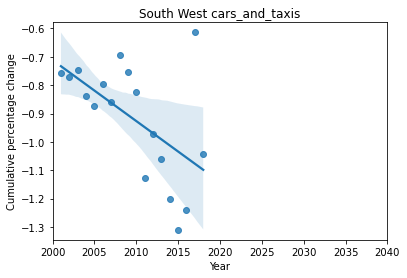

10 year prediction is -1.3563217293449554 % change from the year 2000
20 year prediction is -1.5711815555804307 % change from the year 2000


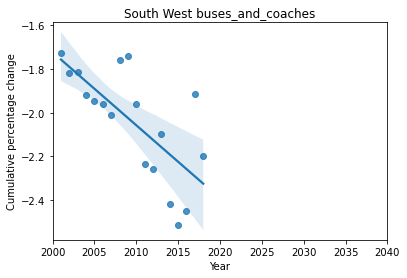

10 year prediction is -2.7253746773497625 % change from the year 2000
20 year prediction is -3.0594248391130066 % change from the year 2000


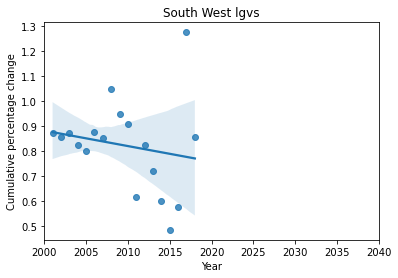

10 year prediction is 0.6972917883338532 % change from the year 2000
20 year prediction is 0.635597315927452 % change from the year 2000


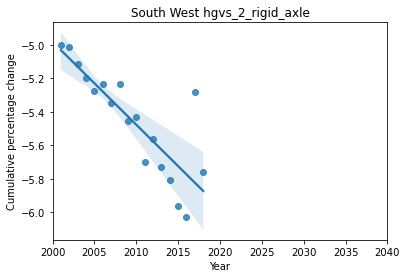

10 year prediction is -6.46766428905039 % change from the year 2000
20 year prediction is -6.963001356953313 % change from the year 2000


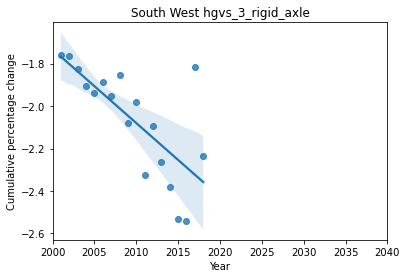

10 year prediction is -2.7752081344605983 % change from the year 2000
20 year prediction is -3.122753794138319 % change from the year 2000


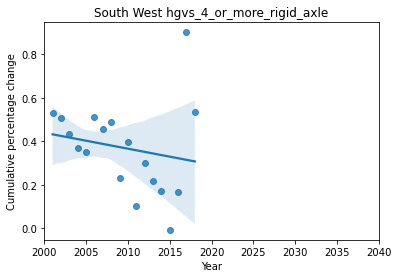

10 year prediction is 0.2194313520650546 % change from the year 2000
20 year prediction is 0.1462388573361011 % change from the year 2000


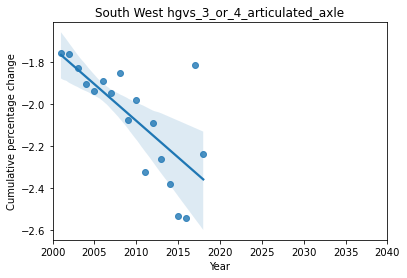

10 year prediction is -2.7752081344605983 % change from the year 2000
20 year prediction is -3.122753794138319 % change from the year 2000


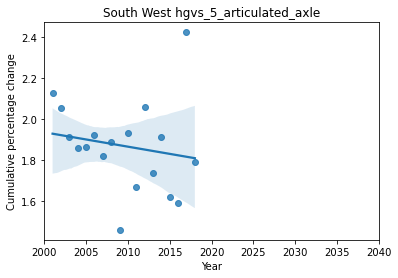

10 year prediction is 1.7239028310280577 % change from the year 2000
20 year prediction is 1.6533459538652586 % change from the year 2000


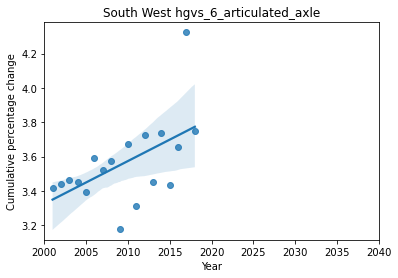

10 year prediction is 4.073304963386825 % change from the year 2000
20 year prediction is 4.322872087462301 % change from the year 2000
************************************************** North West **************************************************


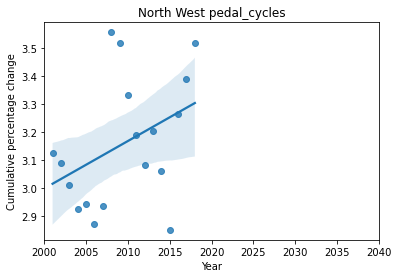

10 year prediction is 3.506964112108001 % change from the year 2000
20 year prediction is 3.676204981679554 % change from the year 2000


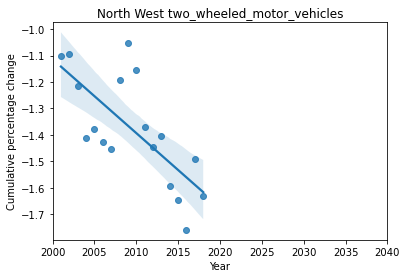

10 year prediction is -1.951149095498046 % change from the year 2000
20 year prediction is -2.2302785355028263 % change from the year 2000


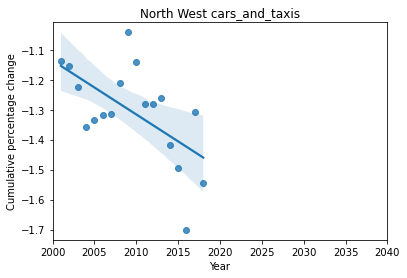

10 year prediction is -1.6756614972458834 % change from the year 2000
20 year prediction is -1.8555418992453525 % change from the year 2000


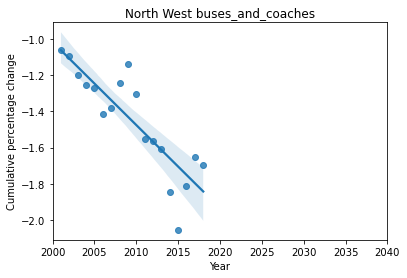

10 year prediction is -2.392395069250796 % change from the year 2000
20 year prediction is -2.8508806349837243 % change from the year 2000


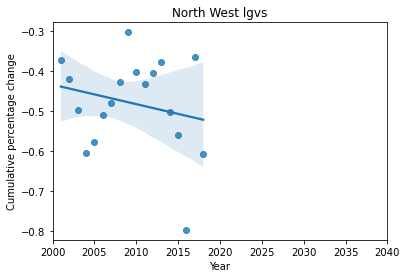

10 year prediction is -0.580739761347548 % change from the year 2000
20 year prediction is -0.629546798963478 % change from the year 2000


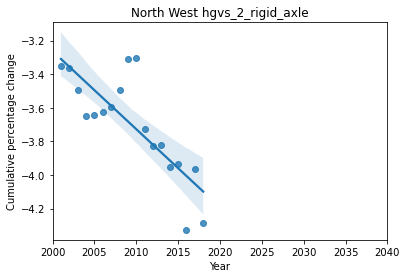

10 year prediction is -4.655892180764496 % change from the year 2000
20 year prediction is -5.120157396578847 % change from the year 2000


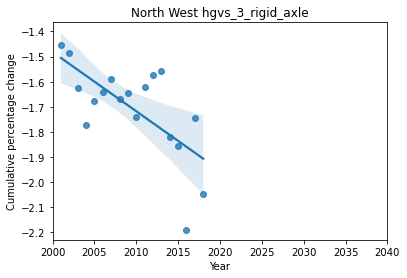

10 year prediction is -2.1895067455640103 % change from the year 2000
20 year prediction is -2.425448763794897 % change from the year 2000


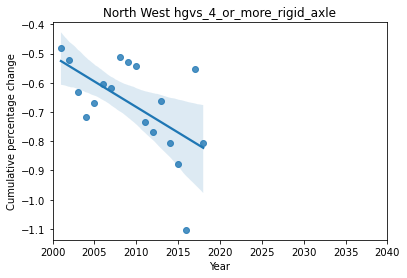

10 year prediction is -1.0321886424771947 % change from the year 2000
20 year prediction is -1.206821861606393 % change from the year 2000


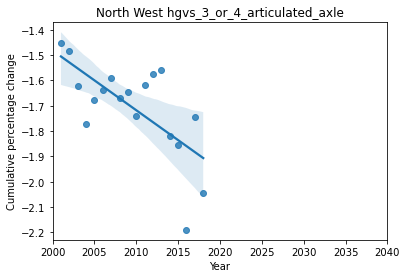

10 year prediction is -2.1895067455640103 % change from the year 2000
20 year prediction is -2.425448763794897 % change from the year 2000


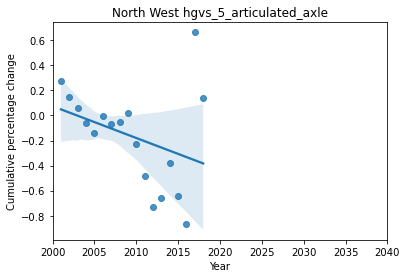

10 year prediction is -0.6877389034183281 % change from the year 2000
20 year prediction is -0.9417169391526414 % change from the year 2000


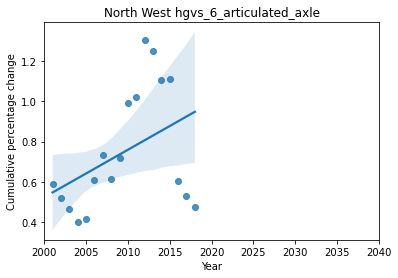

10 year prediction is 1.2314906284939582 % change from the year 2000
20 year prediction is 1.4674236971563914 % change from the year 2000
************************************************** West Midlands **************************************************


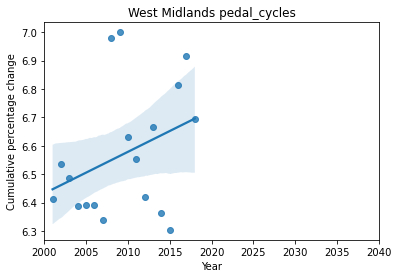

10 year prediction is 6.871912778963232 % change from the year 2000
20 year prediction is 7.018565850635667 % change from the year 2000


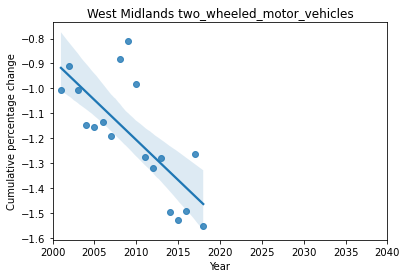

10 year prediction is -1.8507556137933179 % change from the year 2000
20 year prediction is -2.1725456589925543 % change from the year 2000


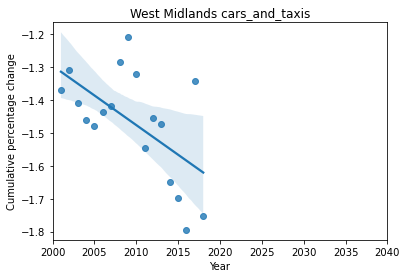

10 year prediction is -1.8367942262154955 % change from the year 2000
20 year prediction is -2.016989320602015 % change from the year 2000


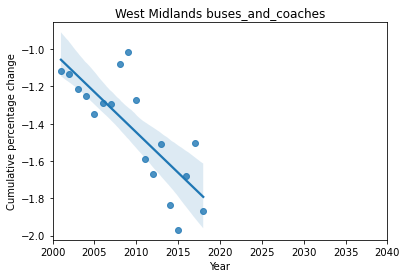

10 year prediction is -2.311566271694943 % change from the year 2000
20 year prediction is -2.7441821102712822 % change from the year 2000


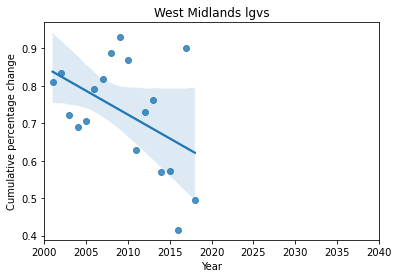

10 year prediction is 0.4685540117924951 % change from the year 2000
20 year prediction is 0.3411837204380461 % change from the year 2000


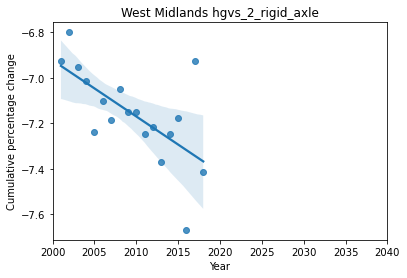

10 year prediction is -7.664149524367176 % change from the year 2000
20 year prediction is -7.911377008417887 % change from the year 2000


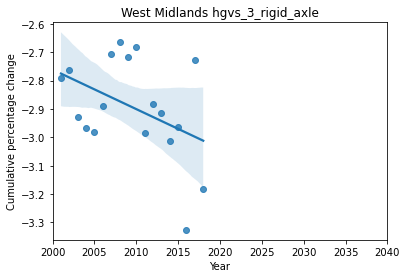

10 year prediction is -3.178809343116658 % change from the year 2000
20 year prediction is -3.3178755141428518 % change from the year 2000


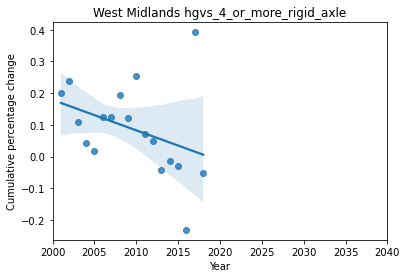

10 year prediction is -0.10947680617604405 % change from the year 2000
20 year prediction is -0.20549180199538242 % change from the year 2000


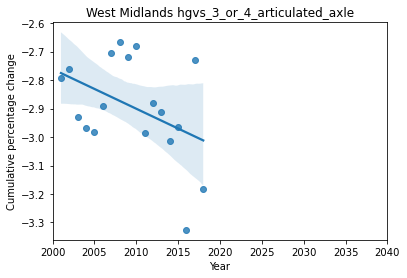

10 year prediction is -3.178809343116658 % change from the year 2000
20 year prediction is -3.3178755141428518 % change from the year 2000


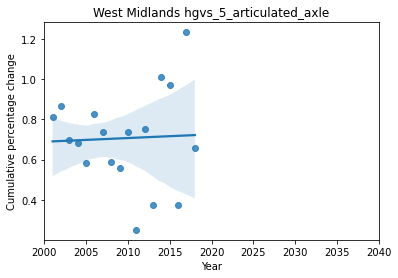

10 year prediction is 0.7440166774723322 % change from the year 2000
20 year prediction is 0.7624618663283269 % change from the year 2000


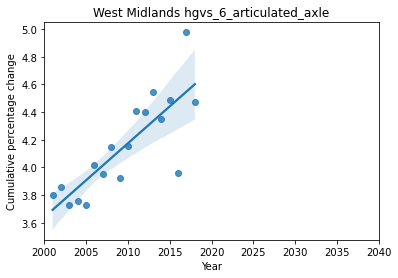

10 year prediction is 5.242141995215505 % change from the year 2000
20 year prediction is 5.776176217968384 % change from the year 2000
************************************************** East of England **************************************************


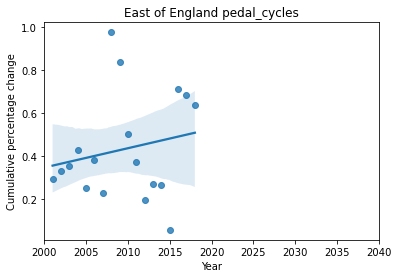

10 year prediction is 0.6154762175433817 % change from the year 2000
20 year prediction is 0.7055738155215465 % change from the year 2000


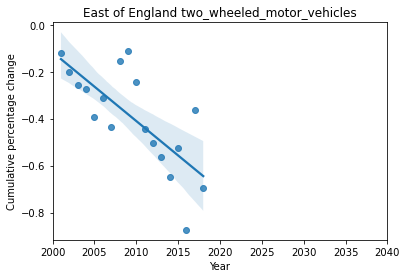

10 year prediction is -0.9967233238213353 % change from the year 2000
20 year prediction is -1.2899396422123814 % change from the year 2000


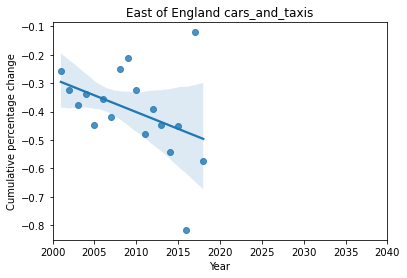

10 year prediction is -0.6374102371342723 % change from the year 2000
20 year prediction is -0.7552089594379225 % change from the year 2000


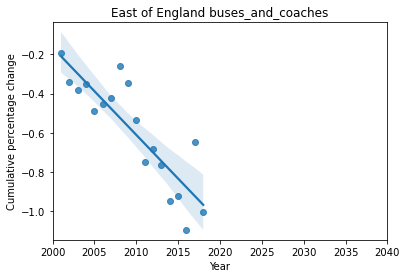

10 year prediction is -1.5005721863475259 % change from the year 2000
20 year prediction is -1.9457685845905388 % change from the year 2000


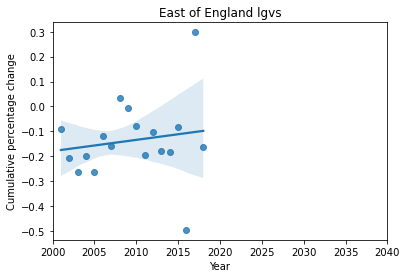

10 year prediction is -0.043724151759201746 % change from the year 2000
20 year prediction is 0.0014351084748440712 % change from the year 2000


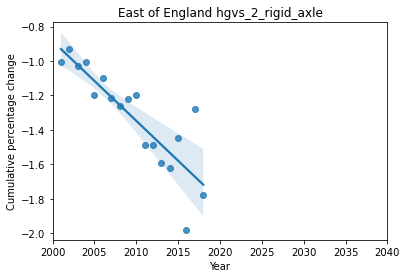

10 year prediction is -2.273647237167282 % change from the year 2000
20 year prediction is -2.736881505817962 % change from the year 2000


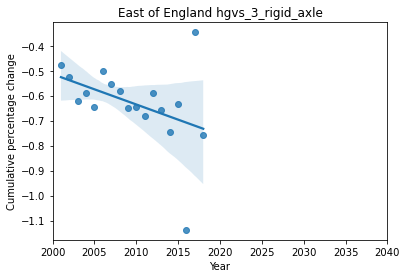

10 year prediction is -0.8782780831824049 % change from the year 2000
20 year prediction is -0.9997372912764568 % change from the year 2000


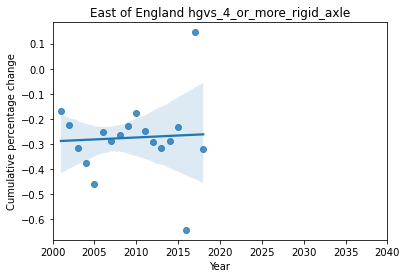

10 year prediction is -0.24310718124463104 % change from the year 2000
20 year prediction is -0.22749945315194564 % change from the year 2000


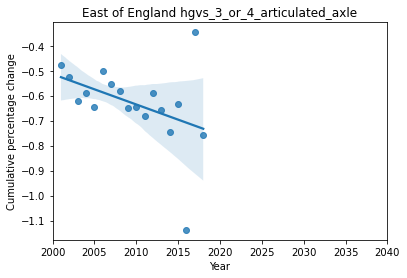

10 year prediction is -0.8782780831824049 % change from the year 2000
20 year prediction is -0.9997372912764568 % change from the year 2000


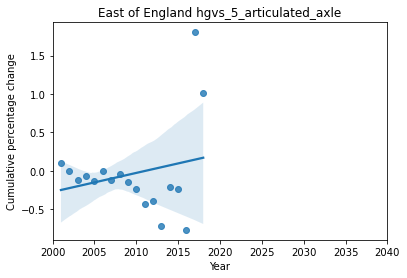

10 year prediction is 0.4666917021656971 % change from the year 2000
20 year prediction is 0.7135747341851655 % change from the year 2000


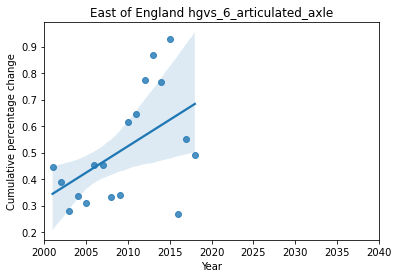

10 year prediction is 0.9231461821987779 % change from the year 2000
20 year prediction is 1.1226921385193052 % change from the year 2000
************************************************** London **************************************************


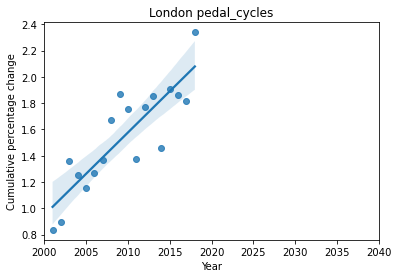

10 year prediction is 2.83381616974377 % change from the year 2000
20 year prediction is 3.4624974982361465 % change from the year 2000


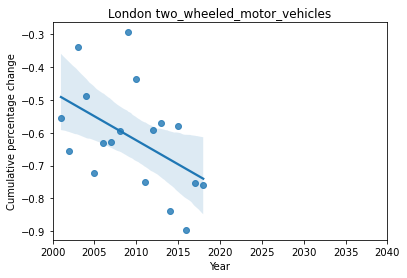

10 year prediction is -0.915532812987994 % change from the year 2000
20 year prediction is -1.0620168819450626 % change from the year 2000


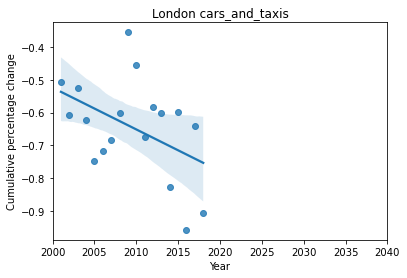

10 year prediction is -0.9066222426951036 % change from the year 2000
20 year prediction is -1.034169901820043 % change from the year 2000


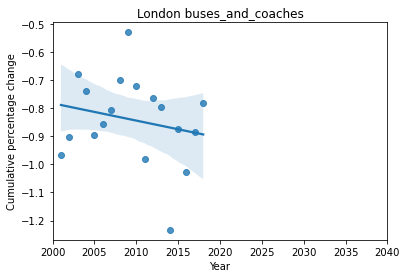

10 year prediction is -0.9674841220793216 % change from the year 2000
20 year prediction is -1.0291339270354953 % change from the year 2000


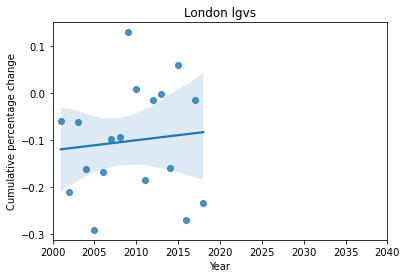

10 year prediction is -0.05740399474362956 % change from the year 2000
20 year prediction is -0.03595808497112429 % change from the year 2000


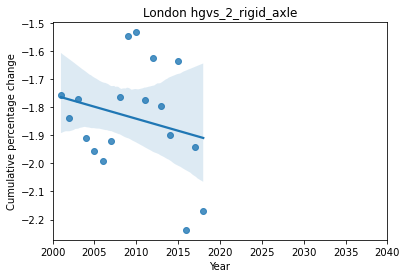

10 year prediction is -2.0122707477807538 % change from the year 2000
20 year prediction is -2.097719368904883 % change from the year 2000


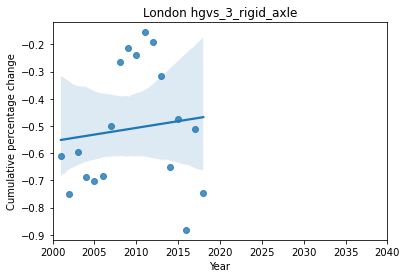

10 year prediction is -0.40846147788181497 % change from the year 2000
20 year prediction is -0.3592122086316607 % change from the year 2000


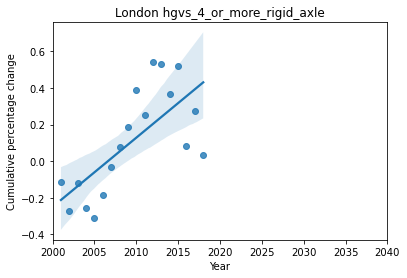

10 year prediction is 0.884896412844455 % change from the year 2000
20 year prediction is 1.2629879456797966 % change from the year 2000


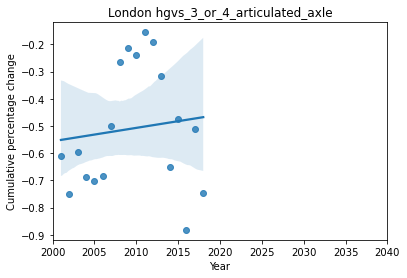

10 year prediction is -0.40846147788181497 % change from the year 2000
20 year prediction is -0.3592122086316607 % change from the year 2000


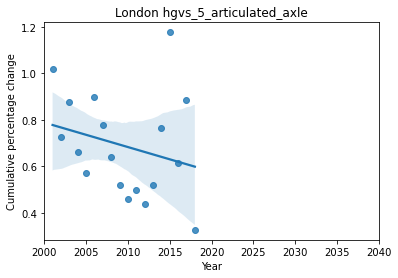

10 year prediction is 0.4719144306236345 % change from the year 2000
20 year prediction is 0.3665239534766762 % change from the year 2000


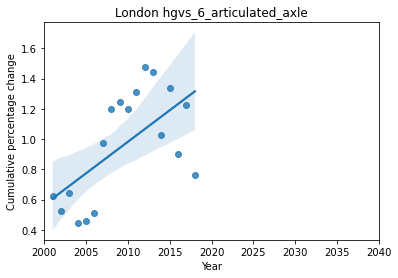

10 year prediction is 1.8161247144534798 % change from the year 2000
20 year prediction is 2.233115045009029 % change from the year 2000
************************************************** Scotland **************************************************


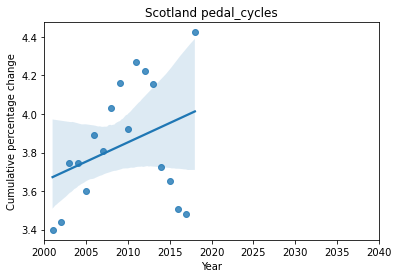

10 year prediction is 4.253958881566135 % change from the year 2000
20 year prediction is 4.454431541425421 % change from the year 2000


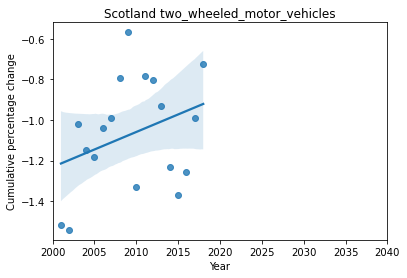

10 year prediction is -0.7139326915604371 % change from the year 2000
20 year prediction is -0.5413980917347345 % change from the year 2000


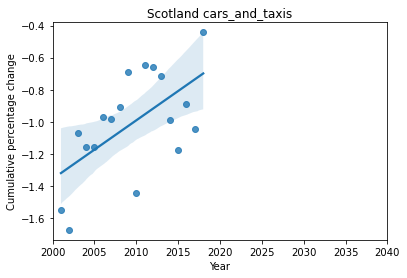

10 year prediction is -0.2599423872527211 % change from the year 2000
20 year prediction is 0.10554034658372302 % change from the year 2000


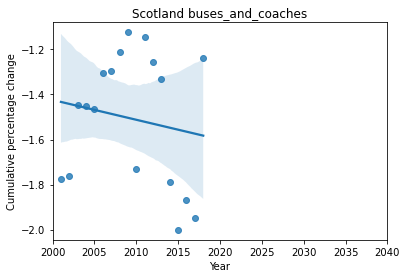

10 year prediction is -1.6884634887323031 % change from the year 2000
20 year prediction is -1.776493353557079 % change from the year 2000


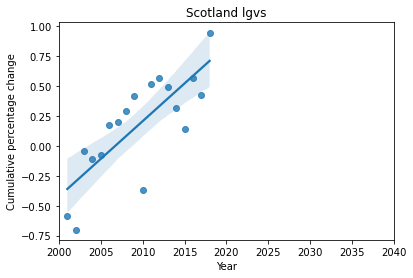

10 year prediction is 1.4658315327088332 % change from the year 2000
20 year prediction is 2.0956777411026337 % change from the year 2000


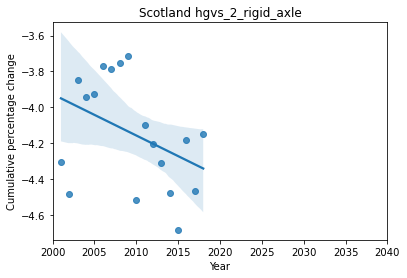

10 year prediction is -4.616598417279114 % change from the year 2000
20 year prediction is -4.846557144607317 % change from the year 2000


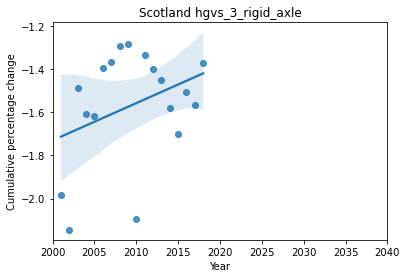

10 year prediction is -1.2134814356461874 % change from the year 2000
20 year prediction is -1.0410853198445622 % change from the year 2000


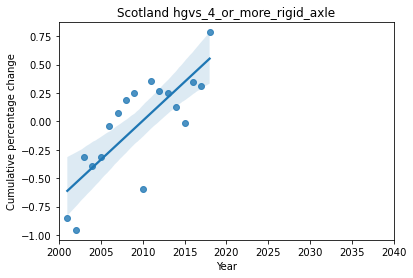

10 year prediction is 1.3748136184323982 % change from the year 2000
20 year prediction is 2.0599717706502076 % change from the year 2000


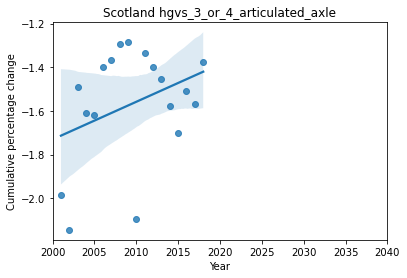

10 year prediction is -1.2134814356461874 % change from the year 2000
20 year prediction is -1.0410853198445622 % change from the year 2000


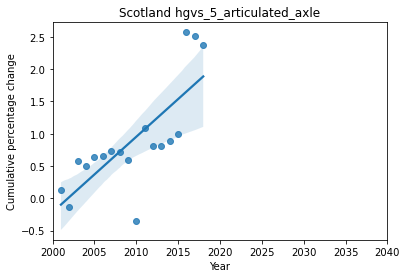

10 year prediction is 3.2881875357782633 % change from the year 2000
20 year prediction is 4.455614627950524 % change from the year 2000


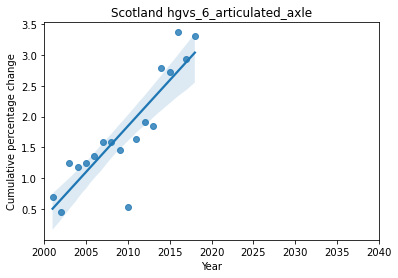

10 year prediction is 4.818898634906304 % change from the year 2000
20 year prediction is 6.305202360731755 % change from the year 2000
************************************************** North East **************************************************


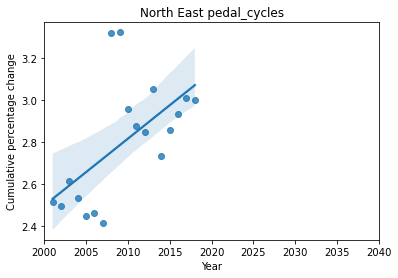

10 year prediction is 3.4562294470473276 % change from the year 2000
20 year prediction is 3.7759727721789815 % change from the year 2000


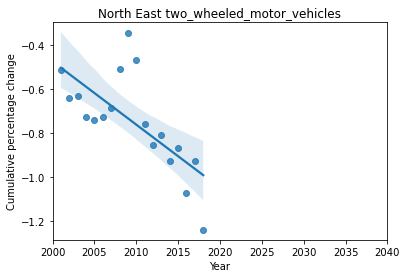

10 year prediction is -1.3363323872156059 % change from the year 2000
20 year prediction is -1.6241553696267061 % change from the year 2000


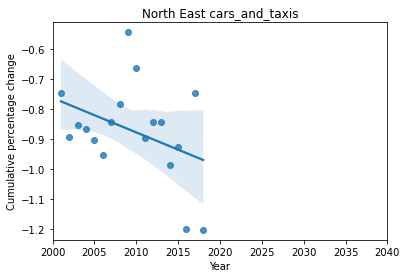

10 year prediction is -1.1073777650758352 % change from the year 2000
20 year prediction is -1.222040647533312 % change from the year 2000


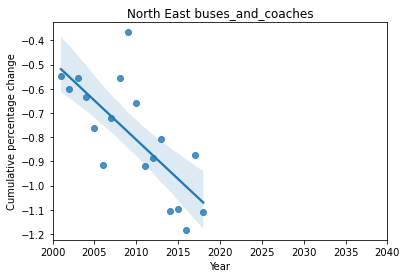

10 year prediction is -1.4592286509316779 % change from the year 2000
20 year prediction is -1.7836076036789308 % change from the year 2000


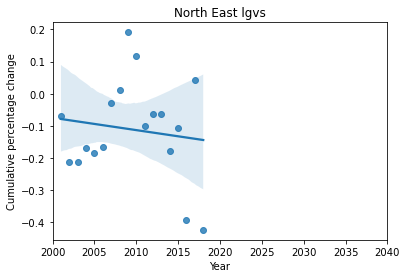

10 year prediction is -0.1905189126563558 % change from the year 2000
20 year prediction is -0.2290225766187559 % change from the year 2000


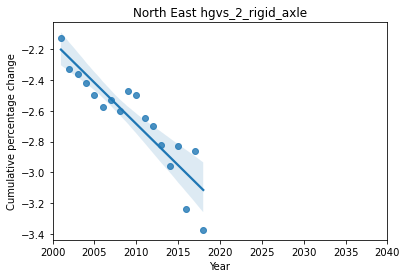

10 year prediction is -3.7567490285392893 % change from the year 2000
20 year prediction is -4.292588075100895 % change from the year 2000


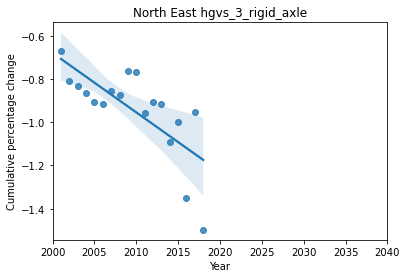

10 year prediction is -1.504402145858755 % change from the year 2000
20 year prediction is -1.7794219594873795 % change from the year 2000


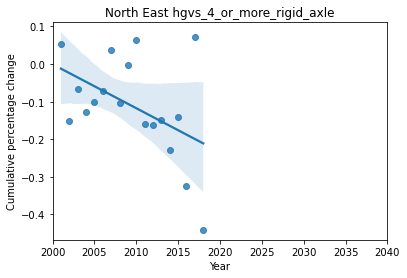

10 year prediction is -0.35138722685902835 % change from the year 2000
20 year prediction is -0.4683569493131259 % change from the year 2000


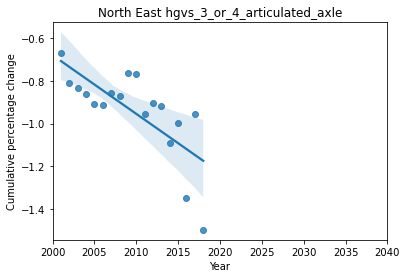

10 year prediction is -1.504402145858755 % change from the year 2000
20 year prediction is -1.7794219594873795 % change from the year 2000


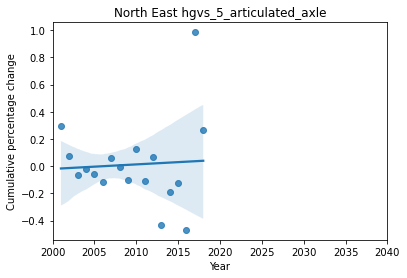

10 year prediction is 0.07986611839144953 % change from the year 2000
20 year prediction is 0.11316481150259428 % change from the year 2000


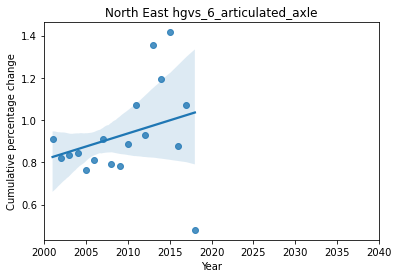

10 year prediction is 1.1847463565154932 % change from the year 2000
20 year prediction is 1.3086234540389121 % change from the year 2000
************************************************** Yorkshire and The Humber **************************************************


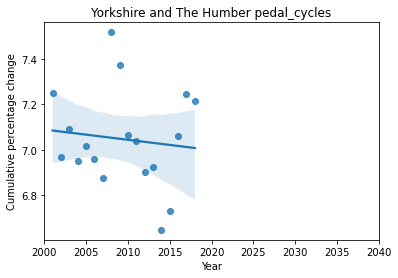

10 year prediction is 6.9533530387099916 % change from the year 2000
20 year prediction is 6.908013404726022 % change from the year 2000


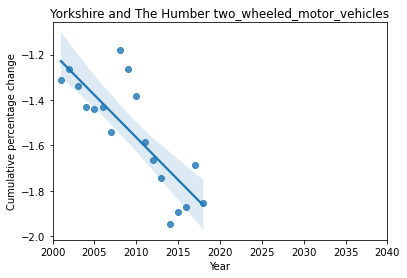

10 year prediction is -2.311825549610475 % change from the year 2000
20 year prediction is -2.685267538926581 % change from the year 2000


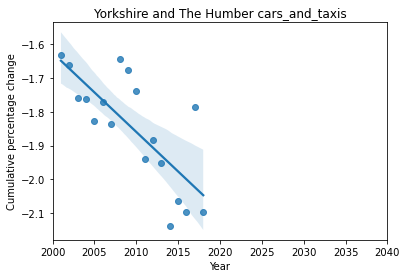

10 year prediction is -2.3268494547203247 % change from the year 2000
20 year prediction is -2.5605082860975443 % change from the year 2000


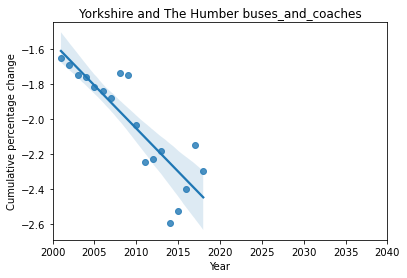

10 year prediction is -3.037421927904205 % change from the year 2000
20 year prediction is -3.529577637566078 % change from the year 2000


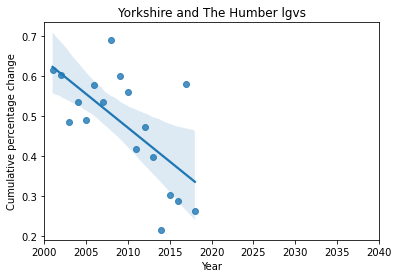

10 year prediction is 0.13214382082428244 % change from the year 2000
20 year prediction is -0.03682714611847615 % change from the year 2000


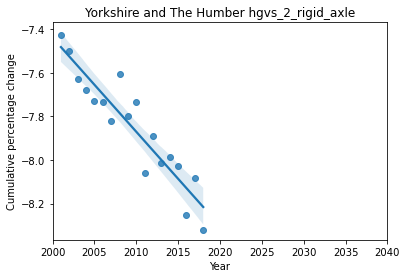

10 year prediction is -8.733137866966686 % change from the year 2000
20 year prediction is -9.164359629692129 % change from the year 2000


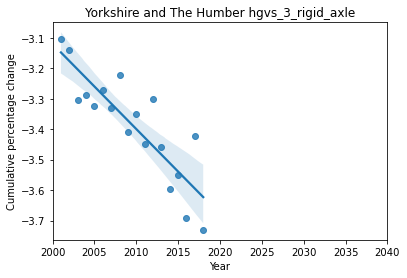

10 year prediction is -3.9583303850965166 % change from the year 2000
20 year prediction is -4.237763146450057 % change from the year 2000


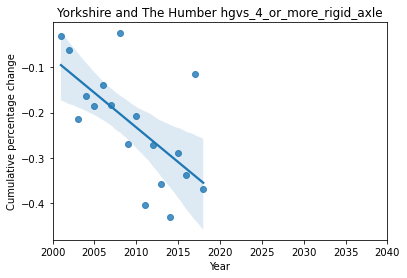

10 year prediction is -0.5373595858352047 % change from the year 2000
20 year prediction is -0.6896814833835059 % change from the year 2000


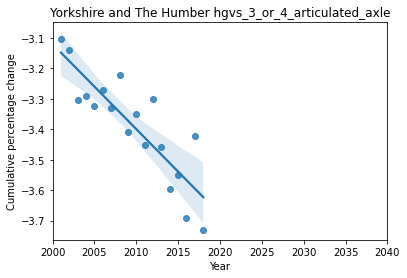

10 year prediction is -3.9583303850965166 % change from the year 2000
20 year prediction is -4.237763146450057 % change from the year 2000


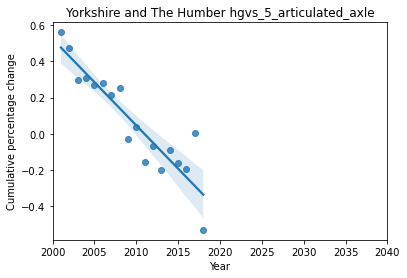

10 year prediction is -0.9109253199001301 % change from the year 2000
20 year prediction is -1.3893187799403393 % change from the year 2000


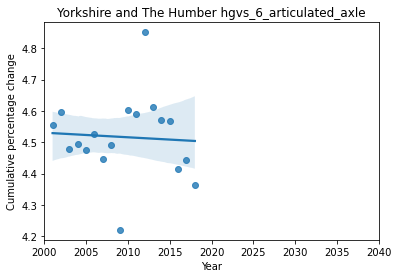

10 year prediction is 4.486349286601009 % change from the year 2000
20 year prediction is 4.471626099726345 % change from the year 2000


In [23]:
tracker_10 = {}
tracker_20 = {}
# fig = plt.figure(figsize=(20,25), dpi=180)
for j in regions_list:
    print('**************************************************', j, '**************************************************')
    tracker_sec_10 = {}
    tracker_sec_20 = {}
    for i in range(11):
       
        plt.xlim(2000, 2040)
        ax = sns.regplot(x=sorted(years), y=cumulative_traffic_changes.loc[j].iloc[:,i])
        plt.title(j + ' ' + cumulative_traffic_changes.columns[i])
        ax.set(xlabel='Year', ylabel='Cumulative percentage change')
#         sns.regplot(x=sorted(years), y=cumulative_traffic_changes.loc[j].iloc[:,i])
        plt.show()
        slope, intercept, r_value, p_value, std_err = stats.linregress(sorted(years)[1:], list(cumulative_traffic_changes.loc[j].iloc[1:,i]))
        y_pred_10 = slope * 2030 + intercept
        y_pred_20 = slope * 2040 + intercept
        print('10 year prediction is', y_pred_10, '%', 'change from the year 2000')
        print('20 year prediction is', y_pred_20, '%', 'change from the year 2000')
        tracker_sec_10[cumulative_traffic_changes.columns[i]] = y_pred_10
        tracker_sec_20[cumulative_traffic_changes.columns[i]] = y_pred_20
    tracker_10[j] = tracker_sec_10
    tracker_20[j] = tracker_sec_20


In [24]:
predictions_10_df = pd.DataFrame.from_dict(tracker_10)
predictions_20_df = pd.DataFrame.from_dict(tracker_20)

In [25]:
mileage_10_years = predictions_10_df.T.mul((average_mileage_region[2000][predictions_10_df.T.columns]/100)) + average_mileage_region[2000][predictions_10_df.T.columns]
mileage_20_years = predictions_20_df.T.mul((average_mileage_region[2000][predictions_20_df.T.columns]/100)) + average_mileage_region[2000][predictions_20_df.T.columns]
mileage_10_years.to_csv('10 Year Pred table.csv')
mileage_20_years.to_csv('20 Year Pred table.csv')

### Risks 
1.) Some of the data is extremely erratic and has an extremely high variance.
2.) Change in legislature isn't represented or accounted for in the data. Neither are events such Extinction Rebellion or Greta Thurnberg.
3.) Major driving changes such as laws that ban all ICE vehicles and 'viral sensations' such as a summer obssession with electric scooters one year.

## Task 3


In [26]:
ev_data = pd.read_csv('veh0132.csv')
ev_data = ev_data.drop(['ONS LA Code'], axis=1)
ev_data.head()

,Region/Local Authority,2019 Q3,2019 Q2,2019 Q1,2018 Q4,2018 Q3,2018 Q2,2018 Q1,2017 Q4,2017 Q3,...,2014 Q1,2013 Q4,2013 Q3,2013 Q2,2013 Q1,2012 Q4,2012 Q3,2012 Q2,2012 Q1,2011 Q4
0,United Kingdom,"247,078","226,738","214,294","200,220","185,393","170,492","157,292","143,647","132,223",...,"18,621","16,891","15,973","15,394","14,576","14,041","13,271","12,797","12,248","11,930"
1,Great Britain,"244,059","223,885","211,532","197,635","182,917","168,155","155,157","141,683","130,428",...,"18,325","16,633","15,742","15,185","14,402","13,876","13,123","12,676","12,144","11,831"
2,England,"220,032","202,021","191,124","179,057","165,314","152,414","140,307","128,758","118,162",...,"16,243","14,779","13,958","13,372","12,754","12,239","11,715","11,227","10,845","10,717"
3,North East,"4,086","3,779","3,614","3,551","3,369","3,224","3,116","2,986","2,866",...,596,523,536,515,496,473,459,458,413,418
4,County Durham UA,782,750,709,708,669,648,616,607,595,...,104,95,87,73,63,58,55,58,55,80


In [27]:
ev_data_region = ev_data[ev_data['Region/Local Authority'].isin(traffic_data.region_name.unique())]
ev_data_region

,Region/Local Authority,2019 Q3,2019 Q2,2019 Q1,2018 Q4,2018 Q3,2018 Q2,2018 Q1,2017 Q4,2017 Q3,...,2014 Q1,2013 Q4,2013 Q3,2013 Q2,2013 Q1,2012 Q4,2012 Q3,2012 Q2,2012 Q1,2011 Q4
3,North East,"4,086","3,779","3,614","3,551","3,369","3,224","3,116","2,986","2,866",...,596,523,536,515,496,473,459,458,413,418
18,North West,"13,041","11,887","11,345","10,615","10,019","9,296","8,723","8,126","7,603",...,"1,507","1,387","1,337","1,183","1,059","1,006",974,915,872,861
63,Yorkshire and The Humber,"16,310","15,222","14,230","12,718","11,589","10,704","9,824","9,119","8,307",...,"1,172","1,033",754,733,736,703,677,650,646,633
90,East Midlands,"13,383","12,466","11,722","10,986","10,144","9,282","8,458","7,830","6,987",...,"1,226","1,139","1,126","1,129","1,093","1,071",937,905,883,889
142,West Midlands,"32,452","30,077","28,513","27,235","25,172","23,629","21,849","19,844","18,345",...,"2,154","2,029","2,010","1,855","1,726","1,647","1,333","1,226","1,069","1,048"
238,London,"34,797","30,764","28,305","24,973","22,483","20,481","18,624","17,123","15,779",...,"2,796","2,616","2,505","2,448","2,388","2,344","2,298","2,225","2,246","2,302"
275,South East,"50,004","46,142","43,555","41,252","38,147","34,560","31,303","28,247","25,626",...,"3,393","3,077","2,899","2,918","2,885","2,845","2,890","2,864","2,829","2,847"
357,South West,"26,067","24,080","23,085","22,320","20,658","17,967","16,383","14,833","13,352",...,"2,026","1,793","1,682","1,560","1,409","1,238","1,138","1,037",990,962
402,Wales,"5,015","4,615","4,327","4,067","3,790","3,534","3,275","2,987","2,805",...,475,435,416,399,378,362,366,350,343,328
426,Scotland,"14,785","13,369","12,451","11,348","10,358","9,312","8,401","7,504","6,892",...,"1,043",905,853,797,726,694,650,596,531,493


In [28]:
ev_data_region = ev_data_region.set_index('Region/Local Authority')
ev_array = np.array(ev_data_region)

In [29]:
import locale
locale.setlocale( locale.LC_ALL, 'en_US.UTF-8' ) 

this_list = []
for m in ev_array:
    that_list = []
    for a in m:
        t = locale.atoi(a)
        that_list.append(int(t))
    this_list.append(np.array(that_list))

In [30]:
ev_UK = ev_data[ev_data['Region/Local Authority'] == 'United Kingdom'].set_index('Region/Local Authority')
ev_UK_2019 = ev_UK.iloc[:,:3]

In [31]:
ev_UK_2019_array = np.array(ev_UK_2019)
one_list = []
for m in ev_UK_2019_array:
    two_list = []
    for a in m:
        t = locale.atoi(a)
        two_list.append(int(t))
    one_list.append(np.array(two_list))
ev_2019_summary = np.sum(one_list)
ev_2019_summary

688110

Research 
10 years time 2030 EVs 2.7-10.6 million 
20 years time 2040 EVs 9.15-36 million
Graph shapes based on what happened in Norway and other countries with similar incentives like those that could be introduced throughout the UK.

In [32]:
upper_bound = np.array([0.688110, 10.600000, 36.000000])
lower_bound = np.array([0.688110, 2.700000, 9.153000])
x_coords = np.array([2019, 2030, 2040])

In [33]:
z_upper = np.polyfit(x_coords, upper_bound, 2)
z_lower = np.polyfit(x_coords, lower_bound, 2)
f_upper = np.poly1d(z_upper)
f_lower = np.poly1d(z_lower)
x_new = np.linspace(2019, 2040, 22)
y_upper = f_upper(x_new)
y_lower = f_lower(x_new)

# plt.plot(x_coords, upper_bound, 'o',x_new,y_upper)
# plt.plot(x_coords, lower_bound, 'o',x_new,y_lower)
# plt.show()


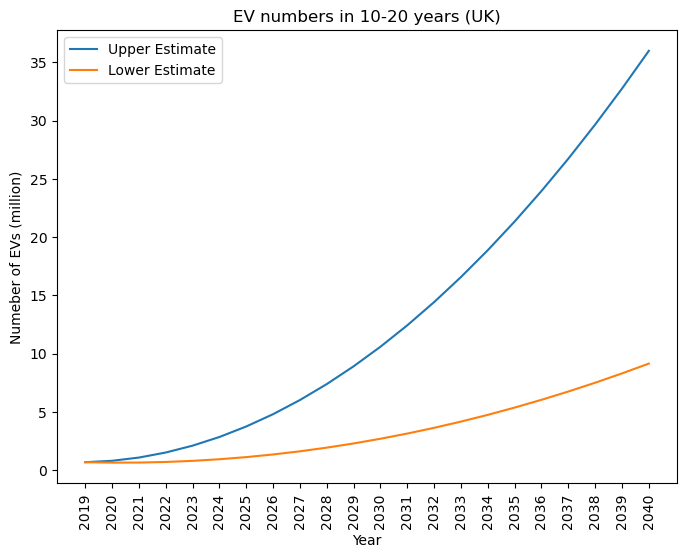

In [34]:
#EV numbers summary for the whole UK
plt.figure(num=None, figsize=(8, 6), dpi=100, facecolor='w', edgecolor='k')
plt.title('EV numbers in 10-20 years (UK)')
plt.xticks(x_new, rotation=90)
plt.plot(x_new,y_upper, label='Upper Estimate')
plt.plot(x_new,y_lower, label='Lower Estimate')
plt.legend()
plt.xlabel('Year')
plt.ylabel('Numeber of EVs (million)')
plt.savefig('Whole UK EV pred')
plt.show()

In [35]:
ev_region_2019 = ev_data_region.iloc[:,:3]
ev_region_array_2019 = np.array(ev_region_2019)
main_list = []
for m in ev_region_array_2019:
    region_list = []
    for a in m:
        t = locale.atoi(a)
        region_list.append(int(t))
    main_list.append(np.array(region_list))

In [36]:
ev_summary_2019 = np.zeros(len(ev_region_array_2019))
for w, v in enumerate(main_list):
    ev_summary_2019[w] = np.sum(v)

ev_proportion  = np.zeros(len(ev_summary_2019))
for r, u in enumerate(ev_summary_2019):
    ev_proportion[r] = u/np.sum(ev_summary_2019)
ev_summary_2019 = ev_summary_2019/1000000

In [37]:
ev_2030_upper = ev_proportion *  10.6
ev_2030_lower = ev_proportion * 2.7
ev_2040_upper = ev_proportion *  36
ev_2040_lower = ev_proportion * 9.15

ev_combined_upper  =  np.concatenate((ev_summary_2019.reshape(10,1), ev_2030_upper.reshape(10,1), ev_2040_upper.reshape(10,1)), axis=1)
ev_combined_lower  =  np.concatenate((ev_summary_2019.reshape(10,1), ev_2030_lower.reshape(10,1), ev_2040_lower.reshape(10,1)), axis=1)

In [38]:
region_list = list(ev_data_region.reset_index()['Region/Local Authority'].unique())
region_list

['North East',
 'North West',
 'Yorkshire and The Humber',
 'East Midlands',
 'West Midlands',
 'London',
 'South East',
 'South West',
 'Wales',
 'Scotland']

In [39]:
#Curve fit
ev_upper_list = []
for y, u in enumerate(ev_combined_upper):
    z_upper = np.polyfit(x_coords, u, 2)
#     z_lower = np.polyfit(x_coords, lower_bound, 2)
    f_upper = np.poly1d(z_upper)
#     f_lower = np.poly1d(z_lower)
    x_new = np.linspace(2019, 2040, 22)
    y_upper = f_upper(x_new)
#     y_lower = f_lower(x_new)
    ev_upper_list.append(y_upper)

ev_lower_list = []
for k, l in enumerate(ev_combined_lower):
#     z_upper = np.polyfit(x_coords, y, 2)
    z_lower = np.polyfit(x_coords, l, 2)
#     f_upper = np.poly1d(z_upper)
    f_lower = np.poly1d(z_lower)
    x_new = np.linspace(2019, 2040, 22)
#     y_upper = f_upper(x_new)
    y_lower = f_lower(x_new)
    ev_lower_list.append(y_lower)

ev_upper_array = np.array(ev_upper_list)
ev_lower_array = np.array(ev_lower_list)

In [40]:
#EV Numbers DataFrames by region
ev_upper_dataframe = pd.DataFrame(ev_upper_array*1000000, columns=x_new, index=region_list)
ev_lower_dataframe = pd.DataFrame(ev_lower_array*1000000, columns=x_new, index=region_list)
ev_upper_dataframe

,2019.0,2020.0,2021.0,2022.0,2023.0,2024.0,2025.0,2026.0,2027.0,2028.0,...,2031.0,2032.0,2033.0,2034.0,2035.0,2036.0,2037.0,2038.0,2039.0,2040.0
North East,11479.000000,14128.636455,19831.173568,28586.611336,40394.949761,55256.188843,73170.328583,9.413737e+04,1.181573e+05,1.452302e+05,...,2.447661e+05,2.840505e+05,3.263879e+05,3.717781e+05,4.202213e+05,4.717173e+05,5.262663e+05,5.838681e+05,6.445229e+05,7.082305e+05
North West,36273.000005,44645.703478,62665.402813,90332.098011,127645.789071,174606.475997,231214.158786,2.974688e+05,3.733705e+05,4.589192e+05,...,7.734472e+05,8.975838e+05,1.031367e+06,1.174798e+06,1.327876e+06,1.490600e+06,1.662972e+06,1.844991e+06,2.036656e+06,2.237969e+06
Yorkshire and The Humber,45761.999998,56324.998819,79058.643154,113962.933003,161037.868365,220283.449238,291699.675628,3.752865e+05,4.710441e+05,5.789722e+05,...,9.757806e+05,1.132391e+06,1.301173e+06,1.482125e+06,1.675247e+06,1.880541e+06,2.098005e+06,2.327639e+06,2.569445e+06,2.823421e+06
East Midlands,37571.000004,46243.313907,64907.833625,93564.559160,132213.490509,180854.627677,239487.970663,3.081135e+05,3.867313e+05,4.753412e+05,...,8.011244e+05,9.297031e+05,1.068274e+06,1.216837e+06,1.375393e+06,1.543940e+06,1.722480e+06,1.911012e+06,2.109536e+06,2.318053e+06
West Midlands,91042.000036,112056.740189,157284.580913,226725.522232,320379.564124,438246.706603,580326.949661,7.466203e+05,9.371267e+05,1.151846e+06,...,1.941284e+06,2.252855e+06,2.588641e+06,2.948639e+06,3.332850e+06,3.741274e+06,4.173912e+06,4.630762e+06,5.111826e+06,5.617103e+06
London,93866.000010,115532.589043,162163.336376,233758.241993,330317.305896,451840.528098,598327.908599,7.697794e+05,9.661951e+05,1.187575e+06,...,2.001500e+06,2.322736e+06,2.668937e+06,3.040101e+06,3.436230e+06,3.857324e+06,4.303381e+06,4.774402e+06,5.270388e+06,5.791338e+06
South East,139701.000036,171947.438095,241348.094700,347902.969836,491612.063517,672475.375730,890492.906488,1.145665e+06,1.437991e+06,1.767471e+06,...,2.978837e+06,3.456934e+06,3.972185e+06,4.524591e+06,5.114150e+06,5.740864e+06,6.404732e+06,7.105755e+06,7.843931e+06,8.619262e+06
South West,73232.000010,90135.752675,126515.942400,182372.569165,257705.632983,352515.133854,466801.071765,6.005634e+05,7.538023e+05,9.265175e+05,...,1.561522e+06,1.812143e+06,2.082240e+06,2.371814e+06,2.680864e+06,3.009391e+06,3.357394e+06,3.724874e+06,4.111830e+06,4.518263e+06
Wales,13957.000001,17178.620004,24112.177846,34757.673528,49115.107051,67184.478413,88965.787615,1.144590e+05,1.436642e+05,1.765813e+05,...,2.976043e+05,3.453692e+05,3.968460e+05,4.520348e+05,5.109355e+05,5.735481e+05,6.398726e+05,7.099092e+05,7.836576e+05,8.611180e+05
Scotland,40604.999998,49977.635965,70149.386069,101120.250307,142890.228683,195459.321192,258827.527839,3.329948e+05,4.179613e+05,5.137268e+05,...,8.658182e+05,1.004780e+06,1.154541e+06,1.315102e+06,1.486461e+06,1.668619e+06,1.861577e+06,2.065334e+06,2.279889e+06,2.505244e+06


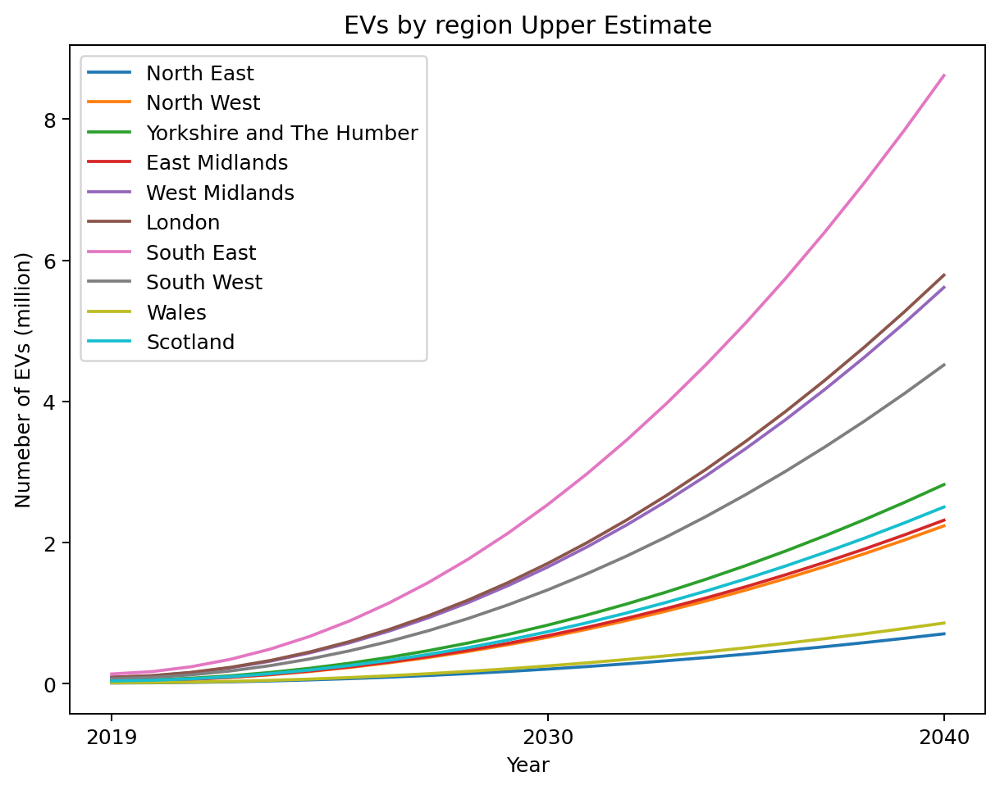

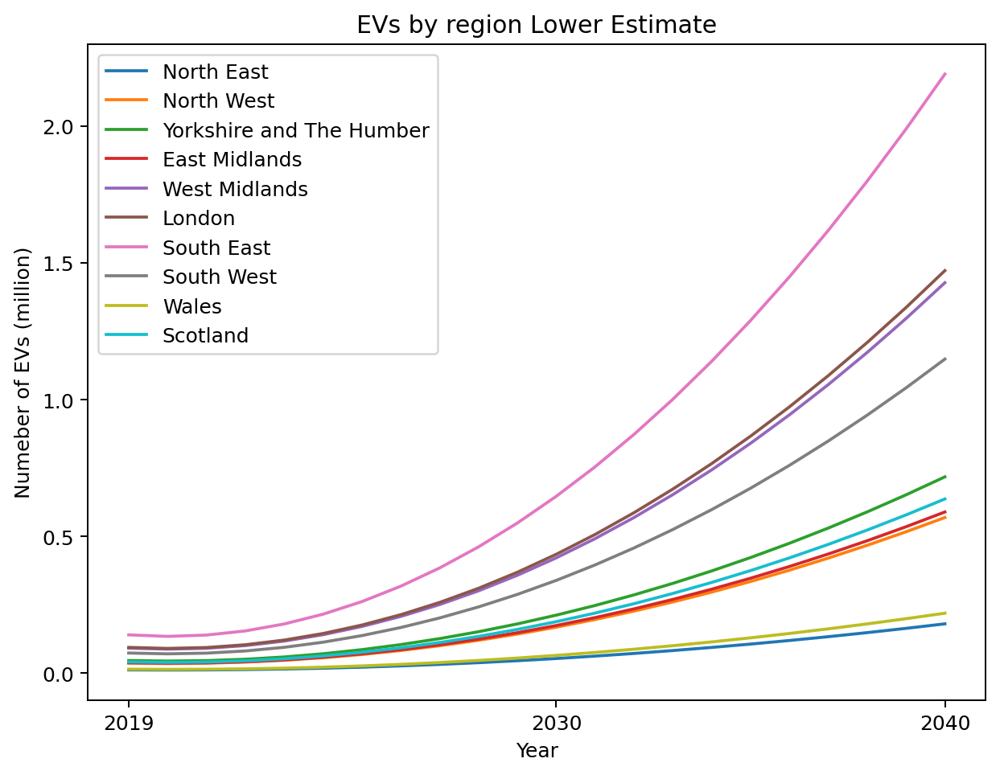

In [41]:
#EV Numbers Graphed by region
plt.figure(num=None, figsize=(8, 6), dpi=180, facecolor='w', edgecolor='k')
plt.title('EVs by region Upper Estimate')
plt.plot(x_new, ev_upper_array[0], label=region_list[0])
plt.plot(x_new, ev_upper_array[1], label=region_list[1])
plt.plot(x_new, ev_upper_array[2], label=region_list[2])
plt.plot(x_new, ev_upper_array[3], label=region_list[3])
plt.plot(x_new, ev_upper_array[4], label=region_list[4])
plt.plot(x_new, ev_upper_array[5], label=region_list[5])
plt.plot(x_new, ev_upper_array[6], label=region_list[6])
plt.plot(x_new, ev_upper_array[7], label=region_list[7])
plt.plot(x_new, ev_upper_array[8], label=region_list[8])
plt.plot(x_new, ev_upper_array[9], label=region_list[9])
# plt.xticks(x_new)
plt.legend()
plt.xlabel('Year')
plt.ylabel('Numeber of EVs (million)')
plt.xticks(x_coords)
plt.savefig('EV pred region Upper')
plt.show()

plt.figure(num=None, figsize=(8, 6), dpi=180, facecolor='w', edgecolor='k')
plt.title('EVs by region Lower Estimate')
plt.plot(x_new, ev_lower_array[0], label=region_list[0])
plt.plot(x_new, ev_lower_array[1], label=region_list[1])
plt.plot(x_new, ev_lower_array[2], label=region_list[2])
plt.plot(x_new, ev_lower_array[3], label=region_list[3])
plt.plot(x_new, ev_lower_array[4], label=region_list[4])
plt.plot(x_new, ev_lower_array[5], label=region_list[5])
plt.plot(x_new, ev_lower_array[6], label=region_list[6])
plt.plot(x_new, ev_lower_array[7], label=region_list[7])
plt.plot(x_new, ev_lower_array[8], label=region_list[8])
plt.plot(x_new, ev_lower_array[9], label=region_list[9])
# plt.xticks(x_new)
plt.legend()
plt.xlabel('Year')
plt.ylabel('Numeber of EVs (million)')
plt.xticks(x_coords)
plt.savefig('EV pred region Lower')
plt.show()

In [42]:
#Predict EV miles Driven
average_mileage_edit = average_mileage.drop(['East of England'], axis=0)
EV_km_upper_dict = {}
EV_km_lower_dict = {}
for q, r in enumerate(x_new):
    EV_km_upper_dict[r] = average_mileage_edit['link_length_km'] * ev_upper_dataframe.iloc[:,q]
    EV_km_lower_dict[r] = average_mileage_edit['link_length_km'] * ev_lower_dataframe.iloc[:,q]
# EV_miles_dict

In [43]:
d_EV_upper = { k: v for k, v in EV_km_upper_dict.items()}
d_EV_lower = { e: w for e, w in EV_km_lower_dict.items()}
EV_upper_km_prediction = pd.concat(d_EV_upper, axis=1)
EV_lower_km_prediction = pd.concat(d_EV_lower, axis=1)
EV_upper_km_prediction

,2019.0,2020.0,2021.0,2022.0,2023.0,2024.0,2025.0,2026.0,2027.0,2028.0,...,2031.0,2032.0,2033.0,2034.0,2035.0,2036.0,2037.0,2038.0,2039.0,2040.0
East Midlands,140430.846109,172845.750663,242608.980170,3.497205e+05,4.941804e+05,6.759886e+05,8.951451e+05,1.151650e+06,1.445503e+06,1.776705e+06,...,2.994399e+06,3.474994e+06,3.992937e+06,4.548229e+06,5.140868e+06,5.770856e+06,6.438193e+06,7.142878e+06,7.884911e+06,8.664292e+06
London,113838.902886,140115.730753,196668.615893,2.834976e+05,4.006026e+05,5.479836e+05,7.256407e+05,9.335739e+05,1.171783e+06,1.440268e+06,...,2.427381e+06,2.816970e+06,3.236836e+06,3.686977e+06,4.167395e+06,4.678089e+06,5.219059e+06,5.790304e+06,6.391826e+06,7.023624e+06
North East,31507.526197,38780.240722,54432.548193,7.846445e+04,1.108759e+05,1.516670e+05,2.008377e+05,2.583880e+05,3.243178e+05,3.986273e+05,...,6.718332e+05,7.796611e+05,8.958685e+05,1.020456e+06,1.153422e+06,1.294768e+06,1.444494e+06,1.602599e+06,1.769084e+06,1.943949e+06
North West,90037.321501,110820.157061,155548.893646,2.242235e+05,3.168441e+05,4.334105e+05,5.739229e+05,7.383811e+05,9.267852e+05,1.139135e+06,...,1.919861e+06,2.227994e+06,2.560074e+06,2.916099e+06,3.296071e+06,3.699988e+06,4.127851e+06,4.579660e+06,5.055415e+06,5.555116e+06
Scotland,170933.951606,210389.725594,295306.286515,4.256836e+05,6.015218e+05,8.228207e+05,1.089580e+06,1.401801e+06,1.759482e+06,2.162624e+06,...,3.644815e+06,4.229800e+06,4.860246e+06,5.536153e+06,6.257521e+06,7.024349e+06,7.836638e+06,8.694388e+06,9.597599e+06,1.054627e+07
South East,421973.641832,519375.570954,729003.618035,1.050858e+06,1.484938e+06,2.031244e+06,2.689777e+06,3.460536e+06,4.343520e+06,5.338731e+06,...,8.997721e+06,1.044184e+07,1.199818e+07,1.366674e+07,1.544754e+07,1.734056e+07,1.934580e+07,2.146328e+07,2.369297e+07,2.603490e+07
South West,288190.528521,354712.013852,497879.291864,7.176924e+05,1.014151e+06,1.387256e+06,1.837006e+06,2.363403e+06,2.966445e+06,3.646132e+06,...,6.145071e+06,7.131342e+06,8.194258e+06,9.333821e+06,1.055003e+07,1.184288e+07,1.321238e+07,1.465853e+07,1.618132e+07,1.778076e+07
Wales,53562.934952,65926.582055,92535.574510,1.333899e+05,1.884896e+05,2.578346e+05,3.414250e+05,4.392607e+05,5.513418e+05,6.776682e+05,...,1.142119e+06,1.325427e+06,1.522980e+06,1.734779e+06,1.960823e+06,2.201112e+06,2.455646e+06,2.724426e+06,3.007451e+06,3.304722e+06
West Midlands,248511.684415,305874.313429,429329.936948,6.188786e+05,8.745202e+05,1.196255e+06,1.584082e+06,2.038003e+06,2.558017e+06,3.144123e+06,...,5.299001e+06,6.149479e+06,7.066051e+06,8.048716e+06,9.097473e+06,1.021232e+07,1.139327e+07,1.264030e+07,1.395343e+07,1.533266e+07
Yorkshire and The Humber,145076.813915,178564.122477,250635.375677,3.612906e+05,5.105297e+05,6.983528e+05,9.247598e+05,1.189751e+06,1.493326e+06,1.835485e+06,...,3.093465e+06,3.589960e+06,4.125038e+06,4.698701e+06,5.310947e+06,5.961778e+06,6.651192e+06,7.379190e+06,8.145772e+06,8.950939e+06


In [44]:
EV_lower_km_prediction

,2019.0,2020.0,2021.0,2022.0,2023.0,2024.0,2025.0,2026.0,2027.0,2028.0,...,2031.0,2032.0,2033.0,2034.0,2035.0,2036.0,2037.0,2038.0,2039.0,2040.0
East Midlands,140430.846109,134869.145747,139681.441101,154867.732165,180428.018940,216362.301422,262670.579619,319352.853530,3.864091e+05,4.638394e+05,...,7.583742e+05,8.773004e+05,1.006601e+06,1.146275e+06,1.296323e+06,1.456745e+06,1.627542e+06,1.808712e+06,2.000256e+06,2.202174e+06
London,113838.902882,109330.364447,113231.404983,125542.024488,146262.222969,175392.000418,212931.356839,258880.292230,3.132388e+05,3.760069e+05,...,6.147687e+05,7.111751e+05,8.159911e+05,9.292166e+05,1.050852e+06,1.180896e+06,1.319351e+06,1.466215e+06,1.621488e+06,1.785171e+06
North East,31507.526202,30259.684829,31339.387232,34746.633408,40481.423361,48543.757088,58933.634590,71651.055868,8.669602e+04,1.040685e+05,...,1.701513e+05,1.968340e+05,2.258442e+05,2.571820e+05,2.908473e+05,3.268402e+05,3.651606e+05,4.058085e+05,4.487840e+05,4.940871e+05
North West,90037.321485,86471.433953,89556.840015,99293.539670,115681.532918,138720.819760,168411.400197,204753.274226,2.477464e+05,2.973909e+05,...,4.862320e+05,5.624817e+05,6.453826e+05,7.349348e+05,8.311384e+05,9.339932e+05,1.043499e+06,1.159657e+06,1.282465e+06,1.411925e+06
Scotland,170933.951613,164164.189509,170021.767700,188506.686173,219618.944945,263358.544004,319725.483353,388719.762997,4.703414e+05,5.645903e+05,...,9.231013e+05,1.067860e+06,1.225245e+06,1.395258e+06,1.577899e+06,1.773166e+06,1.981061e+06,2.201584e+06,2.434733e+06,2.680510e+06
South East,421973.641733,405261.565870,419721.792033,465354.320231,542159.150454,650136.282724,789285.717041,959607.453372,1.161101e+06,1.393768e+06,...,2.278801e+06,2.636156e+06,3.024684e+06,3.444384e+06,3.895257e+06,4.377301e+06,4.890518e+06,5.434908e+06,6.010470e+06,6.617203e+06
South West,288190.528506,276776.872527,286652.608369,317817.736038,370272.255535,444016.166845,539049.469984,655372.164942,7.929843e+05,9.518857e+05,...,1.556327e+06,1.800386e+06,2.065734e+06,2.352372e+06,2.660299e+06,2.989516e+06,3.340022e+06,3.711817e+06,4.104902e+06,4.519276e+06
Wales,53562.934952,51441.599058,53277.097953,59069.431637,68818.600112,82524.603379,100187.441436,121807.114281,1.473836e+05,1.769170e+05,...,2.892580e+05,3.346187e+05,3.839362e+05,4.372105e+05,4.944417e+05,5.556298e+05,6.207746e+05,6.898763e+05,7.629348e+05,8.399502e+05
West Midlands,248511.684335,238669.491098,247185.509167,274059.738551,319292.179251,382882.831257,464831.694579,565138.769216,6.838041e+05,8.208276e+05,...,1.342047e+06,1.552504e+06,1.781318e+06,2.028491e+06,2.294022e+06,2.577911e+06,2.880159e+06,3.200764e+06,3.539728e+06,3.897050e+06
Yorkshire and The Humber,145076.813926,139331.112103,144302.615850,159991.325162,186397.240039,223520.360485,271360.686495,329918.218071,3.991930e+05,4.791849e+05,...,7.834640e+05,9.063247e+05,1.039903e+06,1.184198e+06,1.339210e+06,1.504940e+06,1.681387e+06,1.868551e+06,2.066432e+06,2.275030e+06


Research 
15KWh/100km comsumed on average by EVs
Therefore 0.15KWh/km and .00015MWh/km

In [45]:
EV_power_consumption_lower = EV_lower_km_prediction * 1.5
EV_power_consumption_upper = EV_upper_km_prediction * 1.5
combined_df = pd.concat((EV_power_consumption_lower, EV_power_consumption_upper))
by_row = combined_df.groupby(combined_df.index)
EV_average_consumption_MWh = by_row.mean()

In [46]:
#Average consumption prediction in MWh
EV_average_consumption = EV_average_consumption_MWh.style.set_caption('EV Energy requirements in MWh')
EV_average_consumption


,2019.0,2020.0,2021.0,2022.0,2023.0,2024.0,2025.0,2026.0,2027.0,2028.0,2029.0,2030.0,2031.0,2032.0,2033.0,2034.0,2035.0,2036.0,2037.0,2038.0,2039.0,2040.0
East Midlands,210646.269164,230786.172307,286717.815953,378441.200107,505956.324760,669263.189918,868361.795589,1103252.141759,1373934.228440,1680408.055628,2022673.623313,2400730.931509,2814579.980204,3264220.769420,3749653.299122,4270877.569345,4827893.580067,5420701.331287,6049300.823017,6713692.055265,7413875.028005,8149849.741252
London,170758.354326,187084.571400,232425.015657,306779.687082,410148.585681,542531.711460,703929.064423,894340.644556,1113766.451859,1362206.486352,1639660.748015,1946129.236848,2281611.952864,2646108.896055,3039620.066419,3462145.463966,3913685.088679,4394238.940580,4903807.019654,5442389.325899,6009985.859330,6606596.619927
North East,47261.289299,51779.944163,64328.951568,84908.311513,113518.023997,150158.089022,194828.506588,247529.276693,308260.399338,377021.874522,453813.702246,538635.882513,631488.415320,732371.300664,841284.538550,958228.128976,1083202.071942,1216206.367447,1357241.015494,1506306.016080,1663401.369207,1828527.074874
North West,135055.982239,147968.693261,183829.300246,242637.803195,324394.202107,429098.496990,556750.687837,707350.774654,880898.757429,1077394.636174,1296838.410883,1539230.081557,1804569.648200,2092857.110808,2404092.469379,2738275.723914,3095406.874415,3475485.920892,3878512.863326,4304487.701722,4753410.436092,5225281.066417
Scotland,256400.927415,280915.436327,348996.040662,460642.740397,615855.535557,814634.426122,1056979.412105,1342890.493486,1672367.670284,2045410.942511,2462020.310126,2922195.773182,3425937.331623,3973244.985482,4564118.734771,5198558.579456,5876564.519562,6598136.555070,7363274.685991,8171978.912331,9024249.234074,9920085.651251
South East,632960.462674,693477.852618,861544.057551,1137159.077447,1520322.912332,2011035.562189,2609297.027051,3315107.306894,4128466.401741,5049374.311552,6077831.036359,7213836.576164,8457390.930899,9808494.100664,11267146.085417,12833346.885142,14507096.499865,16288394.929559,18177242.174266,20173638.233912,22277583.108555,24489076.798187
South West,432285.792770,473616.664785,588398.925174,776632.573880,1038317.610944,1373454.036357,1782041.850086,2264081.052190,2819571.642615,3448513.621389,4150906.988495,4926751.743938,5776047.887735,6698795.419875,7694994.340364,8764644.649184,9907746.346364,11124299.431854,12414303.905703,13777759.767906,15214667.018419,16725025.657313
Wales,80344.402428,88026.135835,109359.504347,144344.507963,192981.146685,255269.420512,331209.329445,420800.873484,524044.052625,640938.866873,771485.316227,915683.400686,1073533.120252,1245034.474919,1430187.464695,1628992.089572,1841448.349559,2067556.244648,2307315.774842,2560726.940145,2827789.740550,3108504.176059
West Midlands,372767.526563,408407.853395,507386.584586,669703.720188,895359.260156,1184353.204512,1536685.553248,1952356.306366,2431365.463872,2973713.025759,3579398.992023,4248423.362683,4980786.137720,5776487.317135,6635526.900926,7557904.889113,8543621.281663,9592676.078623,10705069.279956,11880800.885656,13119870.895748,14422279.310220
Yorkshire and The Humber,217615.220881,238421.425935,296203.493645,390961.424008,522695.217022,691404.872683,897090.391004,1139751.771977,1419389.015597,1736002.121870,2089591.090794,2480155.922374,2907696.616597,3372213.173482,3873705.593021,4412173.875205,4987618.020049,5600038.027529,6249433.897681,6935805.630468,7659153.225918,8419476.684011


In [47]:
EV_average_consumption_MWh.iloc[:,-1].sum()

98894702.77951102

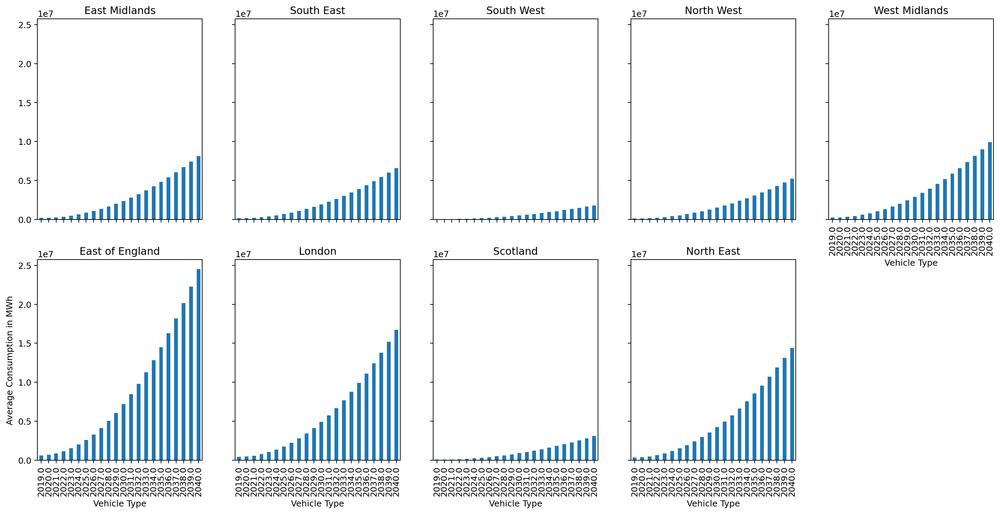

In [48]:
fig = plt.figure(figsize=(20,25), dpi=180)
ax1 = fig.add_subplot(5,5,1)
EV_average_consumption_MWh.iloc[0,:].plot.bar()
plt.title('East Midlands')
count = 1
for exp in range(1, len(EV_average_consumption_MWh)-1):
    count += 1
    fig.add_subplot(5,5,count, sharex=ax1, sharey=ax1)
    plt.xlabel('Vehicle Type')
    plt.ylabel('Average Consumption in MWh')
    plt.title(traffic_data.region_name.unique()[count])
    EV_average_consumption_MWh.iloc[exp,:].plot.bar()
#     plt.axis('off')
#     plt.title('Mileage per region - 2000')
plt.savefig('EV Consumption')
plt.show()

## Task 4